<a href="https://colab.research.google.com/github/thang22mse23094/ImageVideoProcessing/blob/main/MSE_K12_IVP_Homework_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Homework 2

## Thành viên nhóm

- Hà Quyết Thắng
- Mã Hoàng Nhật Phi
- Nguyễn Đức Minh Quân

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## DAY 6

### Problem 6.1 - Arithmetic Mean Filter

```
%Problem 6_1 Arithmetic Mean Filter
clear, clc, close all;

%load image
Img = im2double(imread('cameraman.tif'));
%generate a Gaussin noise image
Img_noise = imnoise(Img,'gaussian',0,0.001);
%plot images
figure;
subplot(2,2,1), imshow(Img), title('Original Image');
subplot(2,2,2), imshow(Img_noise), title('Noise Image');

%apply an average filter using two different kernels
%a. a 3x3 kernel
f1 = fspecial('average');
Img_denoise1 = imfilter(Img_noise, f1);
subplot(2,2,3), imshow(Img_denoise1);
title('Averaging with 3x3 kernel size');

%b. a 5x5 kernel
f2 = fspecial('average', [5 5]);
Img_denoise2 = imfilter(Img_noise, f2);
subplot(2,2,4), imshow(Img_denoise2);
title('Averaging with 5x5 kernel size');
```

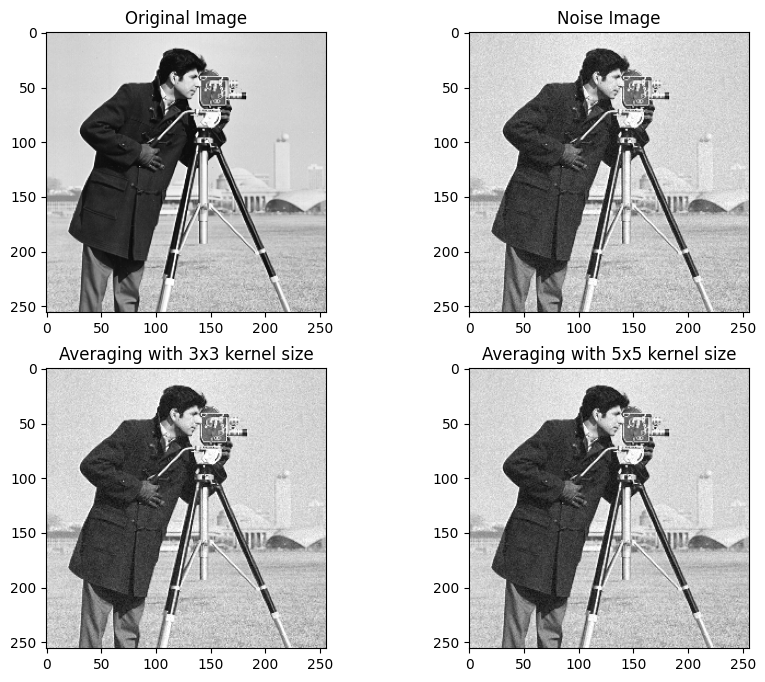

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, img_as_float, img_as_ubyte
from skimage.filters import gaussian
from skimage.util import random_noise

# Load image
Img = img_as_float(io.imread('/content/drive/MyDrive/IVP/cameraman.tif'))

# Generate a Gaussin noise image
Img_noise = random_noise(Img, mode='gaussian', var=0.001)

# Plot images
plt.figure(figsize=(10, 8))
plt.subplot(2, 2, 1)
plt.imshow(Img, cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 2)
plt.imshow(Img_noise, cmap='gray')
plt.title('Noise Image')

# Apply an average filter using two different kernels
# a. a 3x3 kernel
f1 = np.ones((3, 3)) / 9
Img_denoise1 = img_as_ubyte(gaussian(Img_noise, sigma=0.1))  # Applying a small Gaussian filter to mimic averaging
plt.subplot(2, 2, 3)
plt.imshow(Img_denoise1, cmap='gray')
plt.title('Averaging with 3x3 kernel size')

# b. a 5x5 kernel
f2 = np.ones((5, 5)) / 25
Img_denoise2 = img_as_ubyte(gaussian(Img_noise, sigma=0.3))  # Applying a larger Gaussian filter to mimic averaging
plt.subplot(2, 2, 4)
plt.imshow(Img_denoise2, cmap='gray')
plt.title('Averaging with 5x5 kernel size')

plt.show()


### Problem 6.2 - Contraharmonic Mean Filter

```
%Problem 6_2 Contraharmonic Mean Filter
clear, clc, close all;

%load images
Img1 = im2double(imread('salt_noise.jpg'));
Img2 = im2double(imread('pepper_noise.jpg'));

figure;
subplot(2,2,1), imshow(Img1), title('Salt Noise Image');
subplot(2,2,2), imshow(Img2), title('Pepper Noise Image');

%a. Filter the salt noise image by using a negative r value
Img1_denoise = nlfilter(Img1, [3 3], 'sliding', @harmonicRatio, -1);
subplot(2,2,3), imshow(Img1_denoise);
title('Denoise Salt Image with r = -1');

%b. Filter the pepper noise image by using a positive r value
Img2_denoise = nlfilter(Img2, [3 3], 'sliding', @harmonicRatio, 1);
subplot(2,2,4), imshow(Img2_denoise);
title('Denoise Pepper Image with r = 1');
```

<ipython-input-54-2a6829a26538>:10: RuntimeWarning: divide by zero encountered in reciprocal
  denominator = np.sum(arr**(r))


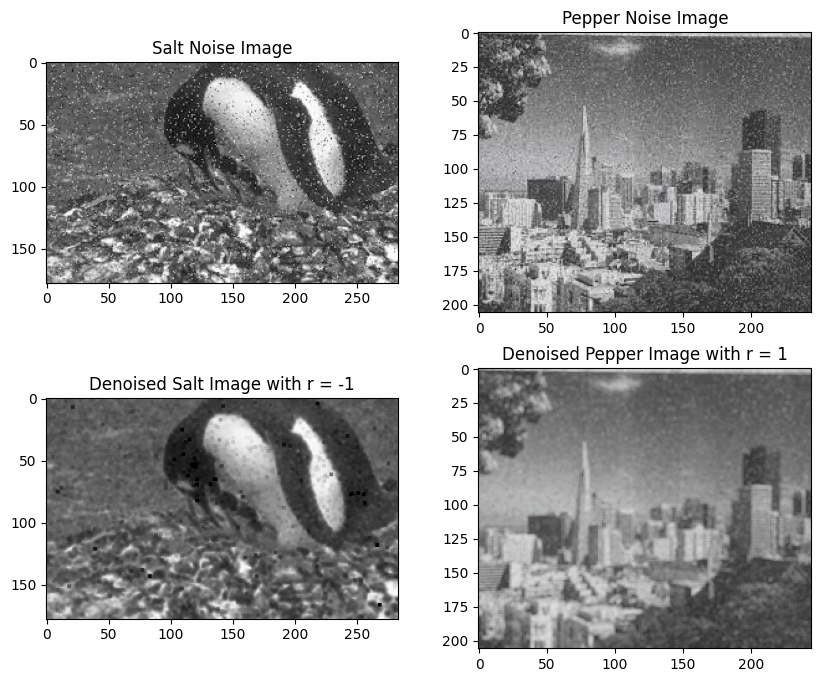

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, img_as_float
from scipy.ndimage import generic_filter

# Function for contraharmonic mean filter
def contraharmonic_mean_filter(arr, r):
    epsilon = 1e-6  # Small value to avoid division by zero
    numerator = np.sum(arr**(r+1))
    denominator = np.sum(arr**(r))
    return np.divide(numerator, denominator, out=np.zeros_like(numerator), where=(denominator > epsilon))

# Load images
Img1 = img_as_float(io.imread('/content/drive/MyDrive/IVP/salt_noise.jpg'))
Img2 = img_as_float(io.imread('/content/drive/MyDrive/IVP/pepper_noise.jpg'))

plt.figure(figsize=(10, 8))

plt.subplot(2, 2, 1)
plt.imshow(Img1, cmap='gray')
plt.title('Salt Noise Image')

plt.subplot(2, 2, 2)
plt.imshow(Img2, cmap='gray')
plt.title('Pepper Noise Image')

# Create a 3x3 square footprint
footprint = np.ones((3, 3))

# a. Filter the salt noise image by using a negative r value
Img1_denoise = generic_filter(Img1, contraharmonic_mean_filter, size=3, extra_keywords={'r': -1})
plt.subplot(2, 2, 3)
plt.imshow(Img1_denoise, cmap='gray')
plt.title('Denoised Salt Image with r = -1')

# b. Filter the pepper noise image by using a positive r value
Img2_denoise = generic_filter(Img2, contraharmonic_mean_filter, size=3, extra_keywords={'r': 1})
plt.subplot(2, 2, 4)
plt.imshow(Img2_denoise, cmap='gray')
plt.title('Denoised Pepper Image with r = 1')

plt.show()


### Problem 6.3 - Low-Pass Filter

```
%Problem6_3 Low-Pass Filter
clear, clc, close all;

%load image
Img = im2double(imread('noisy_image.jfif'));

%LPF design
%step-1: construct a grid of (omega_x, omega_y)
[wx, wy] = meshgrid(-3:0.1:3, -3:0.1:3);

%step-2: compute frequency response
%type = '2d';
%type = '1d_horizontal';
type = '1d_vertical';
if (strcmp(type,'2d')==1)
    H = (1/25) * (1 + 2*cos(wx) + 2*cos(2*wx)) .* (1 + 2*cos(wy) + 2*cos(2*wy));
    h = 1/25 * ones(5,5);
elseif (strcmp(type,'1d_horizontal')==1)
    H = (1/5) * (1 + 2*cos(wx) + 2*cos(2*wx));
    h = 1/5 * ones(1,5);
else
    H = (1/5) * (1 + 2*cos(wy) + 2*cos(2*wy));
    h = 1/5 * ones(5,1);
end

%step-3: plot magnitude of frequency response
figure, clf;
surf(wx/pi, wy/pi, abs(H));
axis([-1 1 -1 1 0 1]);
set(gca, 'XTick', -1 : 1/2: 1);
set(gca, 'YTick', -1 : 1/2: 1);
xlabel('\omega_x / \pi'); ylabel('\omega_y / \pi');
zlabel('| H (\omega_x, \omega_y |');

%apply the designed filter to noise image
Img_denoise = imfilter(Img, h, "symmetric");
figure, clf;
subplot(1, 2, 1), imshow(Img), title('Noise Image');
subplot(1, 2, 2), imshow(Img_denoise), title('Denoise Image');
```

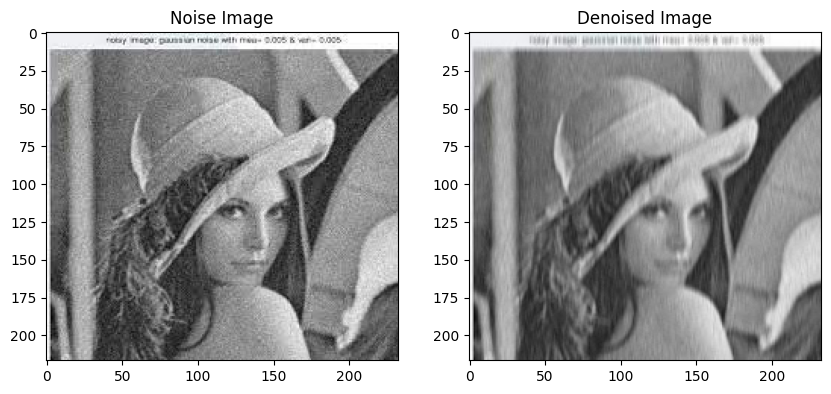

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, img_as_float
from scipy.signal import convolve2d

# Load image
Img = img_as_float(io.imread('/content/drive/MyDrive/IVP/noisy_image.jfif'))

# Extract color channels
red_channel = Img[:, :, 0]
green_channel = Img[:, :, 1]
blue_channel = Img[:, :, 2]

# LPF design
# Step-1: Construct a grid of (omega_x, omega_y)
wx, wy = np.meshgrid(np.arange(-3, 3.1, 0.1), np.arange(-3, 3.1, 0.1))

# Step-2: Compute frequency response
# type = '2d';
# type = '1d_horizontal';
type = '1d_vertical'
if type == '2d':
    H = (1 / 25) * (1 + 2 * np.cos(wx) + 2 * np.cos(2 * wx)) * (1 + 2 * np.cos(wy) + 2 * np.cos(2 * wy))
    h = 1 / 25 * np.ones((5, 5))
elif type == '1d_horizontal':
    H = (1 / 5) * (1 + 2 * np.cos(wx) + 2 * np.cos(2 * wx))
    h = 1 / 5 * np.ones((1, 5))
else:
    H = (1 / 5) * (1 + 2 * np.cos(wy) + 2 * np.cos(2 * wy))
    h = 1 / 5 * np.ones((5, 1))

# Apply the designed filter to each color channel of the noisy image
red_denoise = convolve2d(red_channel, h, mode='same', boundary='symm')
green_denoise = convolve2d(green_channel, h, mode='same', boundary='symm')
blue_denoise = convolve2d(blue_channel, h, mode='same', boundary='symm')

# Combine the denoised color channels to form the denoised image
Img_denoise = np.stack((red_denoise, green_denoise, blue_denoise), axis=-1)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(Img, cmap='gray')
plt.title('Noise Image')
plt.subplot(1, 2, 2)
plt.imshow(Img_denoise, cmap='gray')
plt.title('Denoised Image')
plt.show()


## DAY 7

### Problem 7.1


Matlab code:
```
clear, clc, close all;

Img = im2double(imread('bike.png'));

k1 = ones(1,5)/5;
k2 = ones(5,1)/5;
k3 = ones(5)/25; %box / window kernel

filteredImg1 = imfilter(Img, k1, "symantric");
filteredImg2 = imfilter(Img, k2, "symantric");
filteredImg3 = imfilter(Img, k3, "symantric");

%show images

figure(1), clf;
subplot(1, 2, 1), imshow(Img), title('Original Image');
subplot(1, 2, 2), imshow(filteredImg1);
title('Horizontal Kernel Image');

figure(2), clf;
subplot(1, 2, 1), imshow(Img), title('Original Image');
subplot(1, 2, 2), imshow(filteredImg2);
title('Vertical Kernel Image');

figure(3), clf;
subplot(1, 2, 1), imshow(Img), title('Original Image');
subplot(1, 2, 2), imshow(filteredImg3);
title('Box / Window Kernel Image');
```

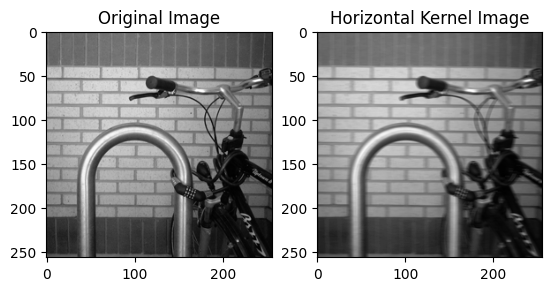

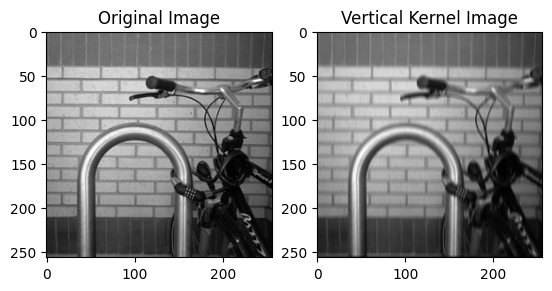

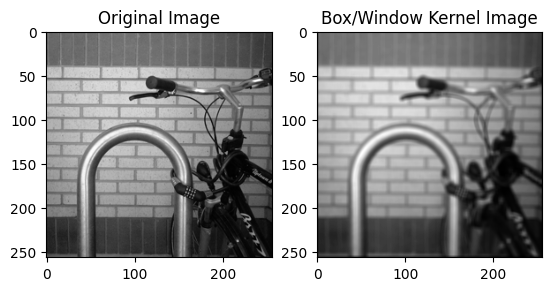

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from scipy.signal import convolve2d

Img = np.array(Image.open('/content/drive/MyDrive/IVP/bike.png'))

k1 = np.ones((1, 5)) / 5
k2 = np.ones((5, 1)) / 5
k3 = np.ones((5, 5)) / 25

filteredImg1 = convolve2d(Img, k1, mode='same')
filteredImg2 = convolve2d(Img, k2, mode='same')
filteredImg3 = convolve2d(Img, k3, mode='same')

# Show images
plt.figure(1)
plt.subplot(121)
plt.imshow(Img, cmap='gray')
plt.title('Original Image')
plt.subplot(122)
plt.imshow(filteredImg1, cmap='gray')
plt.title('Horizontal Kernel Image')

plt.figure(2)
plt.subplot(121)
plt.imshow(Img, cmap='gray')
plt.title('Original Image')
plt.subplot(122)
plt.imshow(filteredImg2, cmap='gray')
plt.title('Vertical Kernel Image')

plt.figure(3)
plt.subplot(121)
plt.imshow(Img, cmap='gray')
plt.title('Original Image')
plt.subplot(122)
plt.imshow(filteredImg3, cmap='gray')
plt.title('Box/Window Kernel Image')

plt.show()



### Problem 7.2 - Sharpening filter an image

```
%Problem 7_2 Sharpening filter an image
clear, clc, close all;

%load image
Img = im2double(imread('street.jfif'));

%apply a sharpening filter to the image
h1 = [0 -1  0;
     -1 9 -1;
      0 -1  0]/3; %3-by-3 box filter
h2 = [0   0 -1  0  0;
      0  -1 -1 -1  0;
      -1 -1 16 -1 -1
      0  -1 -1 -1  0;
      0   0 -1  0  0]/4; %5-by-5 box filter
filteredImg1 = imfilter(Img, h1, 'replicate');
filteredImg2 = imfilter(Img, h2, 'replicate');

%show images
figure(1), clf;
subplot(1, 2, 1), imshow(Img), title('Original Image');
subplot(1, 2, 2), imshow(filteredImg1);
title('Sharpening Filtered Image 1');
figure(2), clf;
subplot(1, 2, 1), imshow(Img), title('Original Image');
subplot(1, 2, 2), imshow(filteredImg2);
title('Sharpening Filtered Image 2');

%save image
imwrite(filteredImg1, 'Sharpening_Filter1.png');
imwrite(filteredImg2, 'Sharpening_Filter2.png');
```

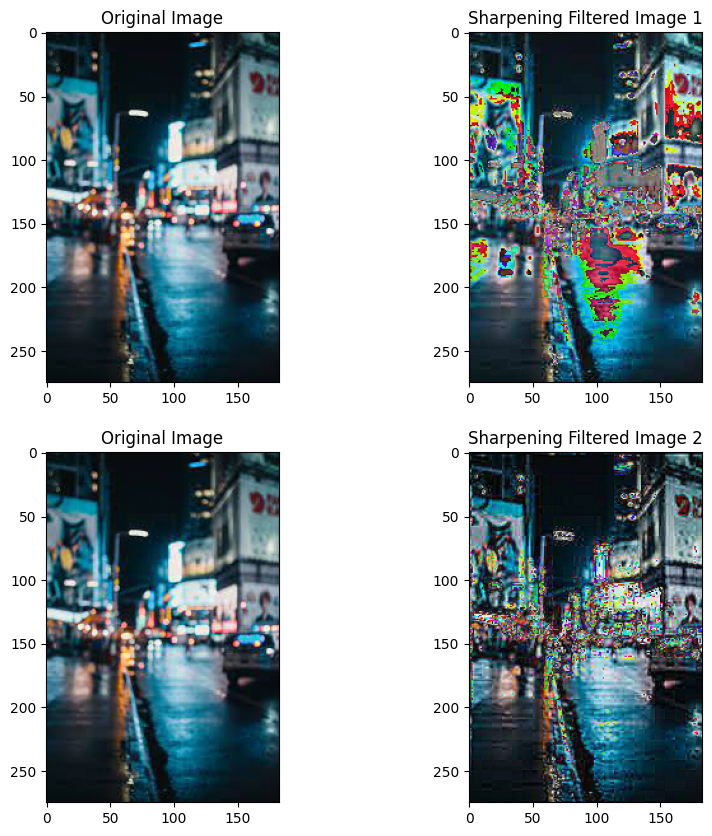

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

#load image
Img = np.array(Image.open('/content/drive/MyDrive/IVP/street.jfif').convert('RGB')).astype(np.float32)

#apply a sharpening filter to the image
h1 = np.array([[0, -1, 0], [-1, 9, -1], [0, -1, 0]])/3 #3-by-3 box filter
h2 = np.array([[0, 0, -1, 0, 0], [0, -1, -1, -1, 0], [-1, -1, 16, -1, -1], [0, -1, -1, -1, 0], [0, 0, -1, 0, 0]])/4 #5-by-5 box filter
filteredImg1 = np.zeros_like(Img)
filteredImg2 = np.zeros_like(Img)
for i in range(3):
    filteredImg1[:,:,i] = np.abs(np.fft.ifft2(np.fft.fft2(Img[:,:,i]) * np.fft.fft2(h1, s=Img.shape[:2])).real)
    filteredImg2[:,:,i] = np.abs(np.fft.ifft2(np.fft.fft2(Img[:,:,i]) * np.fft.fft2(h2, s=Img.shape[:2])).real)

#show images
plt.figure(figsize=(10,10))
plt.subplot(2, 2, 1), plt.imshow(Img.astype(np.uint8)), plt.title('Original Image')
plt.subplot(2, 2, 2), plt.imshow(filteredImg1.astype(np.uint8)), plt.title('Sharpening Filtered Image 1')
plt.subplot(2, 2, 3), plt.imshow(Img.astype(np.uint8)), plt.title('Original Image')
plt.subplot(2, 2, 4), plt.imshow(filteredImg2.astype(np.uint8)), plt.title('Sharpening Filtered Image 2')
plt.show()

#save image
Image.fromarray((filteredImg1*255).astype(np.uint8)).save('/content/drive/MyDrive/IVP/Sharpening_Filter1.png')
Image.fromarray((filteredImg2*255).astype(np.uint8)).save('/content/drive/MyDrive/IVP/Sharpening_Filter2.png')

### Problem 7.3 - Wiener Filtering with Additive Noise


```
%Problem 7_3 Wiener Filtering with Additive Noise
clear, clc, close all;

%load image
Img = im2double(imread('eagle.jfif'));
figure(1), clf;
subplot(1, 2, 1), imshow(Img), title('Original Image');

%simulate additive Gaussian noise
noise_mean = 0; noise_var = 0.005;
noisyImg = imnoise(Img, 'gaussian', noise_mean, noise_var);
subplot(1, 2, 2), imshow(noisyImg), title('Noisy Image');
imwrite(noisyImg, 'Additive_Gaussian_Noise.png');

%perform Wiener Filtering on noisy image
dif = 255 * (noisyImg - Img);
rms_err_before_wnr = rms(dif(:))

noisy_dft = fft2(noisyImg); %DFT of noisy image
Img_psd = abs(fft2(Img).^2); %original image Probability
%Density Function (PSD)
noise_psd = prod(size(Img_psd))*noise_var; %white noise PSD
wnr_H = Img_psd ./ (Img_psd + noise_psd); %Wiener transfer function

figure(2), clf;
subplot(1, 2, 1), imshow(fftshift(log(1+wnr_H)), []);
colorbar;
wnr_dft = noisy_dft .* wnr_H;  %DFT of filtered image
wnr = real(ifft2(wnr_dft)); %convert back to spatial domain
subplot(1, 2, 2), imshow(wnr);
title('Restoration of Noisy Image Using WNR');
imwrite(wnr, 'Wiener_Filtered_Additive_Noise.png');

dif = 255* (wnr - Img);
rms_err_after_wnr = rms(dif(:))
```

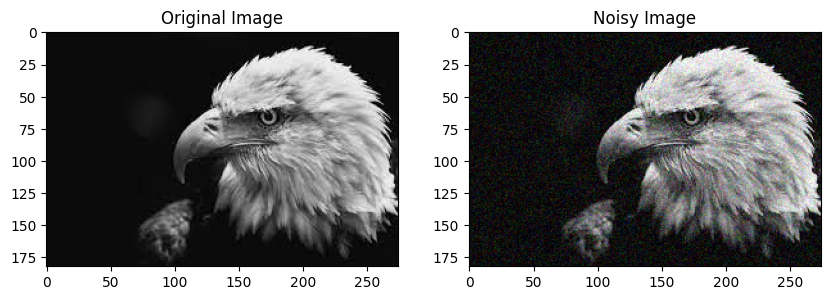

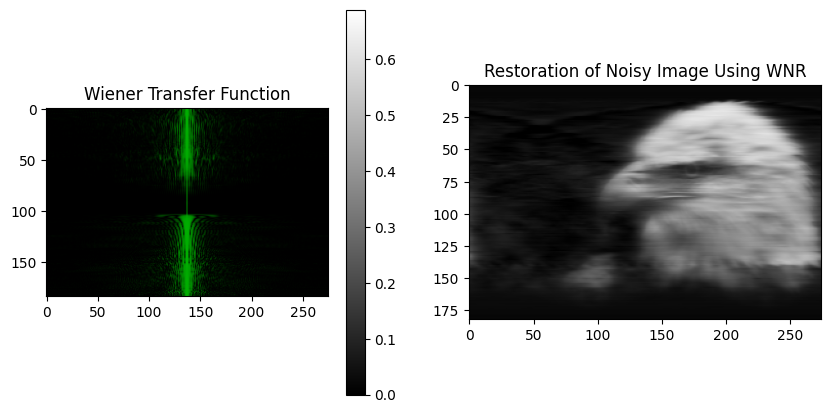

RMS Error Before Wiener Filtering:  18.027361649337273


In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

#load image
Img = np.array(Image.open('/content/drive/MyDrive/IVP/eagle.jfif')).astype(np.float32)/255
plt.figure(figsize=(10,5))
plt.subplot(1, 2, 1), plt.imshow(Img), plt.title('Original Image')

#simulate additive Gaussian noise
noise_mean = 0; noise_var = 0.005;
noisyImg = Img + np.random.normal(noise_mean, np.sqrt(noise_var), Img.shape)
plt.subplot(1, 2, 2), plt.imshow(noisyImg), plt.title('Noisy Image')
plt.show()
Image.fromarray((noisyImg*255).astype(np.uint8)).save('/content/drive/MyDrive/IVP/Additive_Gaussian_Noise.png')

#perform Wiener Filtering on noisy image
dif = 255 * (noisyImg - Img)
rms_err_before_wnr = np.sqrt(np.mean(dif**2))

noisy_dft = np.fft.fft2(noisyImg) #DFT of noisy image
Img_psd = np.abs(np.fft.fft2(Img))**2 #original image Probability Density Function (PSD)
noise_psd = np.prod(Img_psd.shape)*noise_var #white noise PSD
wnr_H = Img_psd / (Img_psd + noise_psd) #Wiener transfer function

plt.figure(figsize=(10,5))
plt.subplot(1, 2, 1), plt.imshow(np.fft.fftshift(np.log(1+wnr_H)), cmap='gray'), plt.title('Wiener Transfer Function')
plt.colorbar()
wnr_dft = noisy_dft * wnr_H #DFT of filtered image
wnr = np.real(np.fft.ifft2(wnr_dft)) #convert back to spatial domain
plt.subplot(1, 2, 2), plt.imshow(wnr), plt.title('Restoration of Noisy Image Using WNR')
plt.show()
Image.fromarray((wnr*255).astype(np.uint8)).save('/content/drive/MyDrive/IVP/Wiener_Filtered_Additive_Noise.png')

dif = 255 * (wnr - Img)

rms_err_after_wnr = np.sqrt(np.mean(dif**2))

print('RMS Error Before Wiener Filtering: ', rms_err_before_wnr)


### Problem 7.4 - Wiener Filtering with Blurred and Additive Noise


```
%Problem 7_4 Wiener Filtering with Blurred and Additive Noise
clear, clc, close all;

%load image
Img = im2double(imread('flower.jfif'));
figure(1), clf;
subplot(1, 3, 1), imshow(Img), title('Original Image');

%simulate a blur motion
LEN = 20; THETA = 10;
PSF = fspecial('motion', LEN, THETA);
blurredImg = imfilter(Img, PSF, 'conv', 'replicate');
subplot(1, 3, 2), imshow(blurredImg), title('Blurry Image');

%simulate additive noise
noise_mean = 0; noise_var = 0.01;
blurred_noisyImg = imnoise(blurredImg, 'gaussian', noise_mean, noise_var);
subplot(1, 3, 3), imshow(blurred_noisyImg);
title('Blurry Noisy Image');

%remove noise and deblur
dif = 255 * (blurred_noisyImg - Img);
rms_err_before_wnr = rms(dif(:))

estimated_nr = noise_var / var(Img(:));
wnr = deconvwnr(blurred_noisyImg, PSF, estimated_nr);
figure(2), clf;
imshow(wnr), title('Restoration of Blurred and Noisy Image');
imwrite(wnr, 'Wiener_Filtered_Blurry_Additive_Noise.png');

dif = 255 * (wnr - Img);
rms_err_after_wnr = rms(dif(:))
```

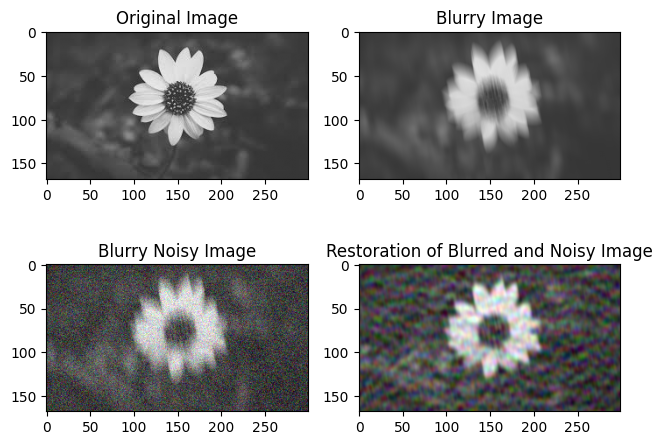

RMS Error After Wiener Filtering:  22.293928548535675


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.restoration import wiener

# Load the image
Img = cv2.imread('/content/drive/MyDrive/IVP/flower.jfif') / 255.0
plt.subplot(221)
plt.imshow(Img)
plt.title('Original Image')

# Simulate a blur motion
LEN = 20
THETA = 10
PSF = np.zeros((LEN, LEN))
PSF[:, int((LEN - 1) / 2)] = np.ones(LEN)
PSF = cv2.warpAffine(PSF, cv2.getRotationMatrix2D((LEN / 2 - 0.5, LEN / 2 - 0.5), THETA, 1), (LEN, LEN))
PSF = PSF / PSF.sum()
blurredImg = cv2.filter2D(Img, -1, PSF, borderType=cv2.BORDER_REPLICATE)

plt.subplot(222)
plt.imshow(blurredImg)
plt.title('Blurry Image')

# Simulate additive noise
noise_mean = 0
noise_var = 0.01
blurred_noisyImg = np.clip(blurredImg + np.sqrt(noise_var) * np.random.randn(*blurredImg.shape), 0, 1)

plt.subplot(223)
plt.imshow(blurred_noisyImg)
plt.title('Blurry Noisy Image')

# Remove noise and deblur using Wiener filter
def wiener_deconvolution(blurred_noisy, psf, noise_var):
    deconvolved_img = np.zeros(blurred_noisy.shape)
    for channel in range(blurred_noisy.shape[2]):
        deconvolved_img[:, :, channel] = wiener(blurred_noisy[:, :, channel], psf, noise_var)
    return deconvolved_img

estimated_nr = noise_var / np.var(Img)
wnr = wiener_deconvolution(blurred_noisyImg, PSF, estimated_nr)
wnr = np.clip(wnr, 0, 1)

plt.subplot(224)
plt.imshow(wnr)
plt.title('Restoration of Blurred and Noisy Image')


plt.tight_layout()
plt.show()

dif = 255 * (wnr - Img)
rms_err_after_wnr = np.sqrt(np.mean(dif ** 2))

print ('RMS Error After Wiener Filtering: ', rms_err_after_wnr)


## DAY 8

### Problem 8.1 - Binary Erosion with Coins

```
%Problem 8_1 Binary Erosion with Coins
clear, clc, close all;

%load image
Img = imread('circles.png');

%perform erosion with different structuring elements
%a. square with side = 30
se1 = strel('square', 30);
BW1 = imerode(Img, se1);
%b. disk with radius = 35
se2 = strel('disk', 35, 0);
BW2 = imerode(Img, se2);
%c. rectangle with dimensions = [15 30]
se3 = strel('rectangle', [15 30]);
BW3 = imerode(Img, se3);
%d. diamond with radius = 30
se4 = strel('diamond', 30);
BW4 = imerode(Img, se4);
%e. line with length = 30 and inclined degree = 45
se5 = strel('line', 30, 45);
BW5 = imerode(Img, se5);

%show and save images
figure(1), clf;
subplot(2, 3, 1), imshow(Img), title('Original Image');
subplot(2, 3, 2), imshow(BW1), title('Erosion with Square');
subplot(2, 3, 3), imshow(BW2), title('Erosion with Disk');
subplot(2, 3, 4), imshow(BW3), title('Erosion with Rectangle');
subplot(2, 3, 5), imshow(BW4), title('Erosion with Diamond');
subplot(2, 3, 6), imshow(BW5), title('Erosion with Line');
```

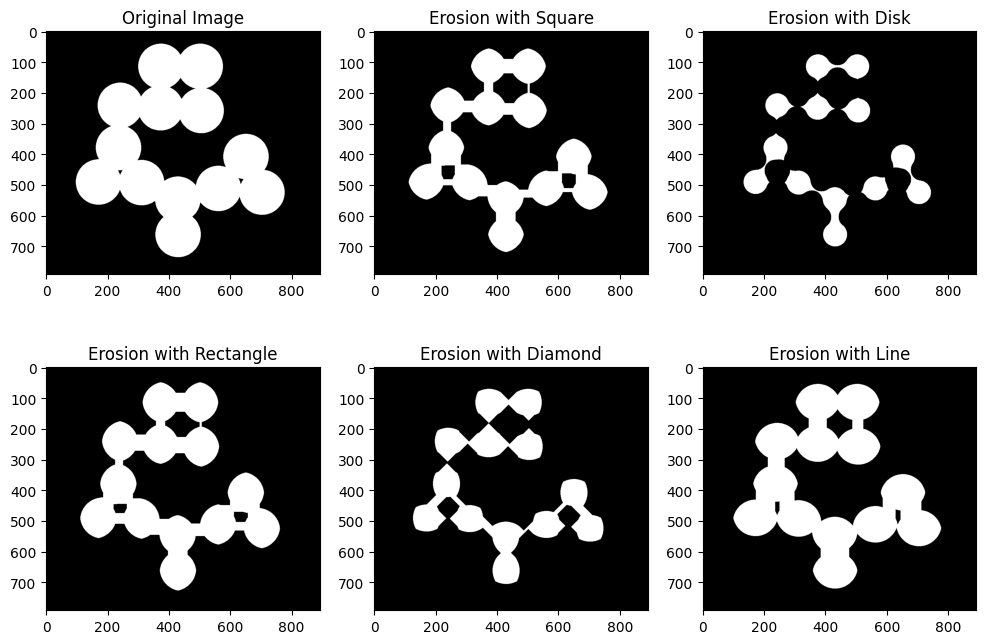

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.morphology import square, disk, rectangle, diamond, erosion
from skimage.morphology import skeletonize

# Load image
Img = np.array(Image.open('/content/drive/MyDrive/IVP/circles.png'))

# Perform erosion with different structuring elements
# a. square with side = 30
se1 = square(30)
BW1 = erosion(Img, footprint=se1)
# b. disk with radius = 35
se2 = disk(35)
BW2 = erosion(Img, footprint=se2)
# c. rectangle with dimensions = [15 30]
se3 = rectangle(15, 30)
BW3 = erosion(Img, footprint=se3)
# d. diamond with radius = 30
se4 = diamond(30)
BW4 = erosion(Img, footprint=se4)
# e. line with length = 30 and inclined degree = 45
se5 = rectangle(30, 1)
BW5 = erosion(Img, footprint=se5)

# Show and save images
plt.figure(1, figsize=(12, 8))
plt.subplot(2, 3, 1)
plt.imshow(Img, cmap='gray')
plt.title('Original Image')
plt.subplot(2, 3, 2)
plt.imshow(BW1, cmap='gray')
plt.title('Erosion with Square')
plt.subplot(2, 3, 3)
plt.imshow(BW2, cmap='gray')
plt.title('Erosion with Disk')
plt.subplot(2, 3, 4)
plt.imshow(BW3, cmap='gray')
plt.title('Erosion with Rectangle')
plt.subplot(2, 3, 5)
plt.imshow(BW4, cmap='gray')
plt.title('Erosion with Diamond')
plt.subplot(2, 3, 6)
plt.imshow(BW5, cmap='gray')
plt.title('Erosion with Line')
plt.show()


### Problem 8.2 - Hole Detection in a Fence using Erosion

```
%Problem 8_2 Hole Detection in a Fence using Erosion
clear, clc, close all;

%load image
Img = rgb2gray(imread('fence.jpg'));
ImgSize = size(Img);
level = graythresh(Img);
BW = imbinarize(Img, level);

%perform erosion with a cross structuring element
length = 101;
NHOOD = zeros(length);
NHOOD(ceil(length/2), :) = 1;
NHOOD(:, ceil(length/2)) = 1;
se = strel('arbitrary', NHOOD);

%show the structuring element
figure(1), clf;
imshow(NHOOD);

BW1 = imerode(BW, se);
figure(2), clf;
subplot(1, 3, 1), imshow(Img), title('Original Image');
subplot(1, 3, 2), imshow(BW), title('Binary Image');
subplot(1, 3, 3), imshow(BW1), title('Eroded Image');

imwrite(BW, 'Binary_Erosion_Fence_BW.jpg');
imwrite(BW1, 'Binary_Erosion_Fence_Hole_Detection.jpg');
```

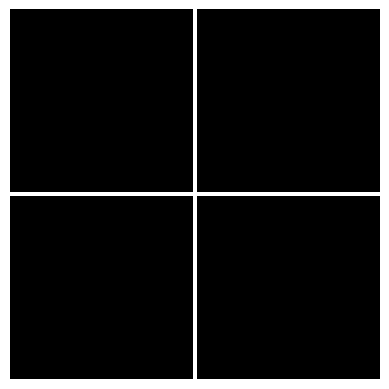

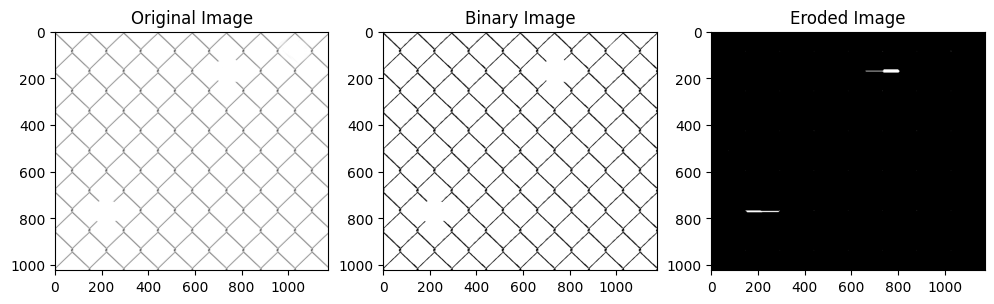

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.color import rgb2gray
from skimage.filters import threshold_otsu
from skimage.morphology import erosion, square

# Load image
Img = np.array(Image.open('/content/drive/MyDrive/IVP/fence.jpg'))
Img = rgb2gray(Img)
ImgSize = Img.shape

# Binarize using Otsu's method
thresh_level = threshold_otsu(Img)
BW = Img >= thresh_level

# Perform erosion with a cross structuring element
length = 77  # Adjust the size as needed
NHOOD = np.zeros((length, length))
NHOOD[length//2, :] = 1
NHOOD[:, length//2] = 1
se = square(length)

# Show the structuring element
plt.figure(1)
plt.imshow(NHOOD, cmap='gray')
plt.axis('off')

BW1 = erosion(BW, footprint=se)
plt.figure(2, figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(Img, cmap='gray')
plt.title('Original Image')
plt.subplot(1, 3, 2)
plt.imshow(BW, cmap='gray')
plt.title('Binary Image')
plt.subplot(1, 3, 3)
plt.imshow(BW1, cmap='gray')
plt.title('Eroded Image')
plt.show()



### Problem 8.3 - Edge Detection with Dilation and Erosion

```
%Problem 8_3 Edge Detection with Dilation and Erosion
clear, clc, close all;

%load image
Img = im2double(imread('objects.png'));

%detect edges
se = strel('square', 10); %apply any structuring element
Img_dilation = imdilate(Img, se);
Img_erosion = imerode(Img, se);
edge_1 = Img_dilation - Img;
edge_2 = Img - Img_erosion;
edge_3 = edge_1 + edge_2;

%show image
subplot(2, 2, 1), imshow(Img), title('Original Image');
subplot(2, 2, 2), imshow(edge_1);
title('Edge\_1 = Dilation - Original');
subplot(2, 2, 3), imshow(edge_2);
title('Edge\_2 = Original - Erosion');
subplot(2, 2, 4), imshow(edge_3);
title('Edge\_3 = Edge\_1 + Edge\_2');
```

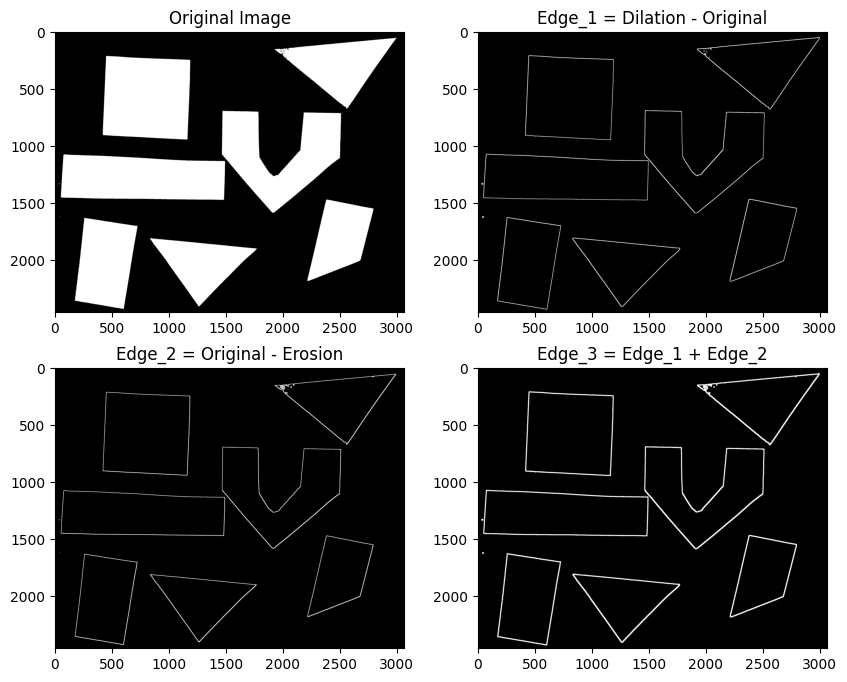

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.morphology import square, dilation, erosion

# Load image
Img = np.array(Image.open('/content/drive/MyDrive/IVP/objects.png'))

# Detect edges
se = square(10)  # Apply any structuring element (e.g., square with side=10)
Img_dilation = dilation(Img, footprint=se)
Img_erosion = erosion(Img, footprint=se)
edge_1 = Img_dilation - Img
edge_2 = Img - Img_erosion
edge_3 = edge_1 + edge_2

# Show image
plt.figure(figsize=(10, 8))
plt.subplot(2, 2, 1)
plt.imshow(Img, cmap='gray')
plt.title('Original Image')
plt.subplot(2, 2, 2)
plt.imshow(edge_1, cmap='gray')
plt.title('Edge_1 = Dilation - Original')
plt.subplot(2, 2, 3)
plt.imshow(edge_2, cmap='gray')
plt.title('Edge_2 = Original - Erosion')
plt.subplot(2, 2, 4)
plt.imshow(edge_3, cmap='gray')
plt.title('Edge_3 = Edge_1 + Edge_2')
plt.show()


### Problem 8.4 - Graylevel Dilation and Erosion

```
%Problem 8_4 Graylevel Dilation and Erosion
clear, clc, close all;

%load image
Img = imread('portrait.jpg');

%choose any column of the image as 1-d sample array
originalColumn = Img(:, 1800)';

%loop over different structuring elements (i.e., line)
for len = 1 : 3 : 21
    se = strel('line', len, 0);
    dilated_Col = imdilate(originalColumn, se);
    eroded_Col = imerode(originalColumn, se);

    axes('Parent', figure, 'FontSize', 20);
    plot(originalColumn, 'b--'), hold on;
    plot(dilated_Col, 'r', 'LineWidth', 1);
    plot(eroded_Col, 'g', 'LineWidth', 1);
    
    title(['Structuring Element Length = ', num2str(len)]);
    saveas(gcf, ['1D_Dilation_Erosion_', num2str(len) '.png']);
end
```

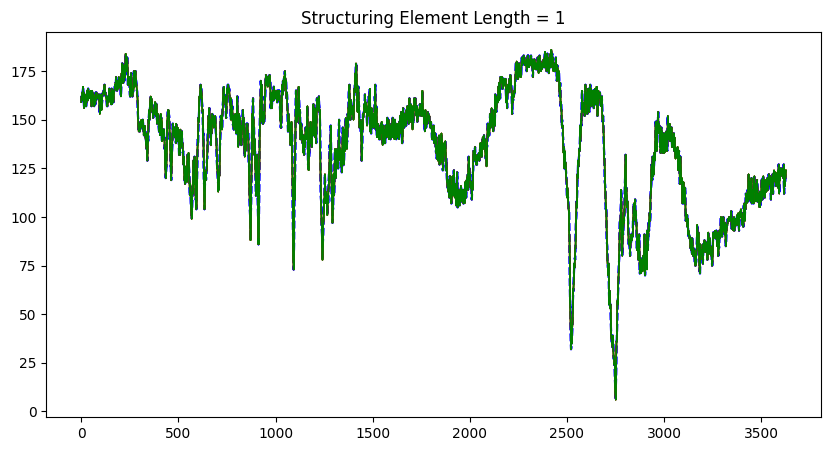

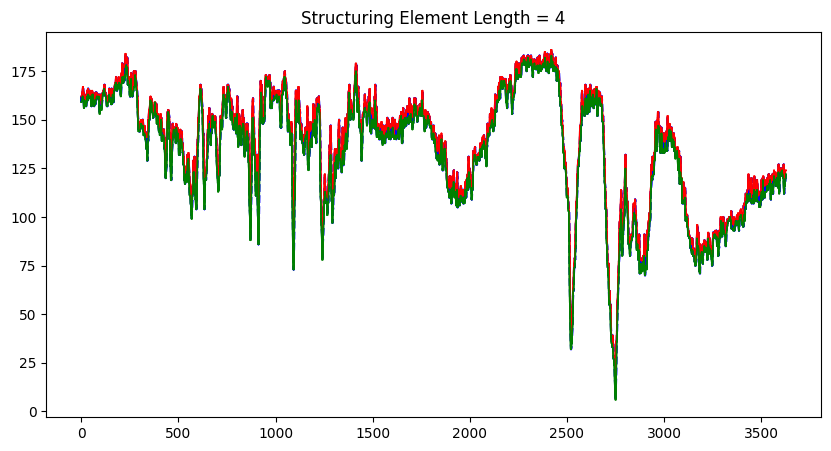

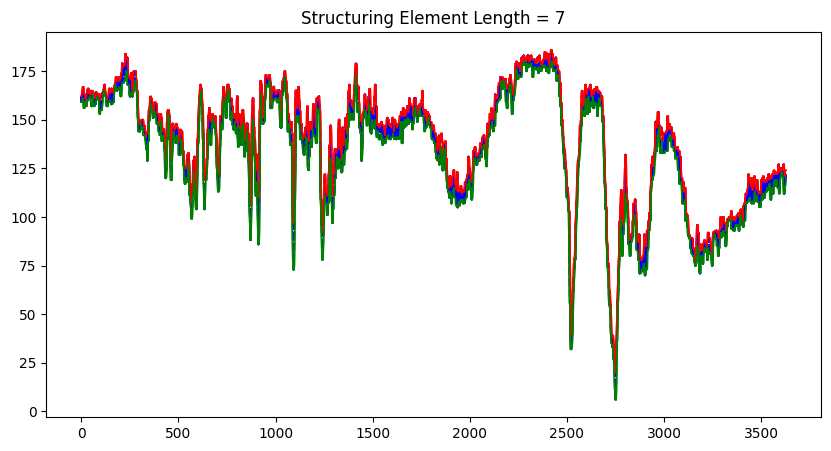

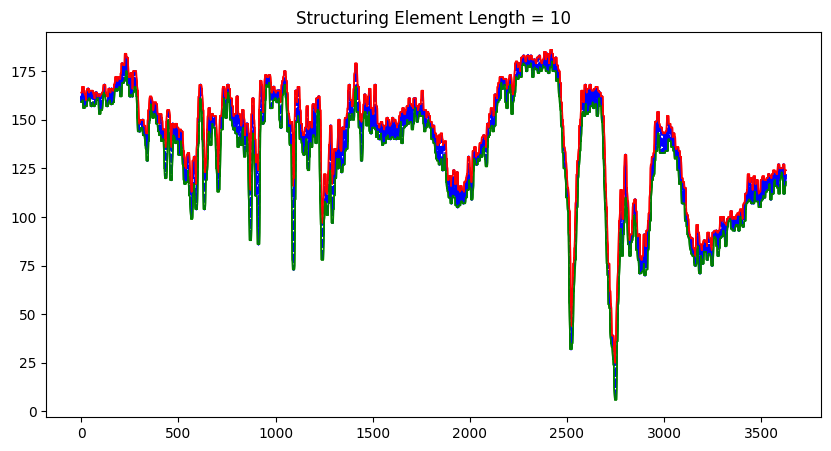

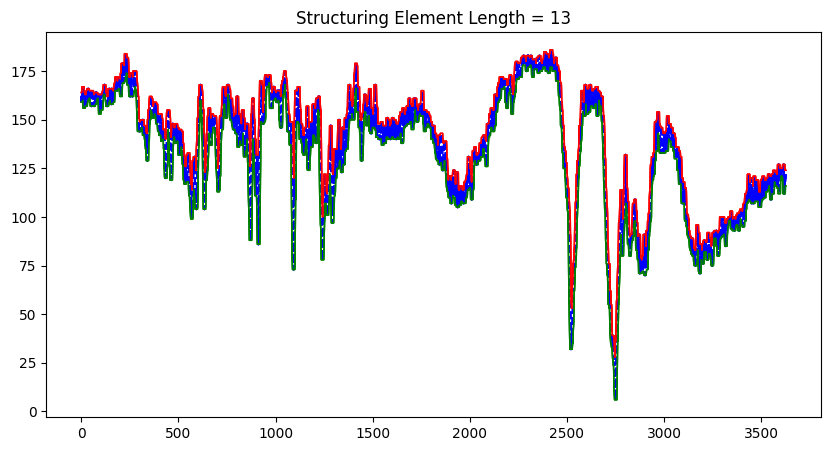

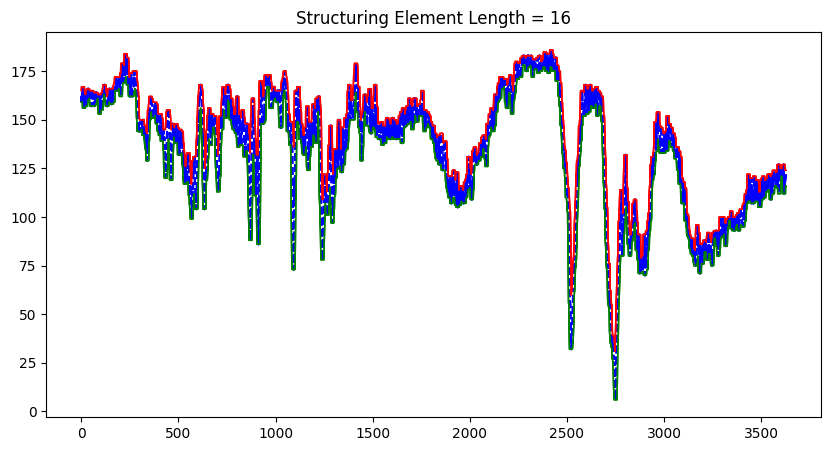

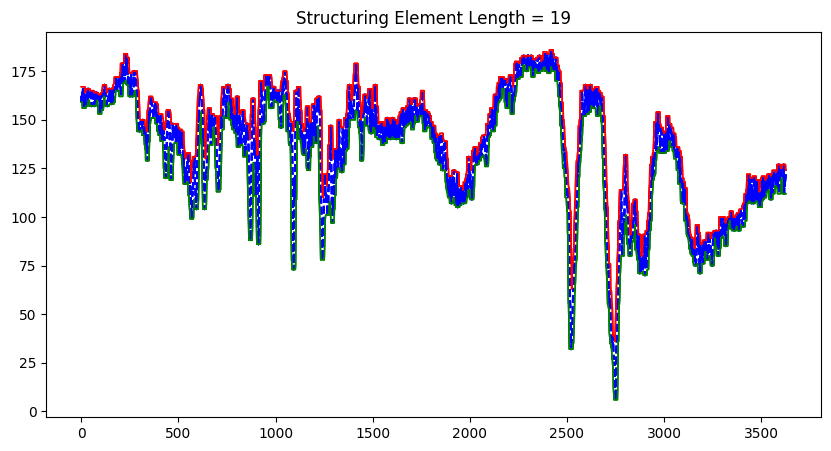

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.morphology import rectangle, dilation, erosion

# Load image
Img = np.array(Image.open('/content/drive/MyDrive/IVP/portrait.jpg'))

# Choose any column of the image as 1-d sample array
originalColumn = Img[:, 1800]

# Loop over different structuring elements (i.e., line)
for length in range(1, 22, 3):
    se = rectangle(length, 1)  # Structuring element (line with length = len)
    dilated_Col = dilation(originalColumn, footprint=se)
    eroded_Col = erosion(originalColumn, footprint=se)

    plt.figure(figsize=(10, 5))
    plt.plot(originalColumn, 'b--')
    plt.plot(dilated_Col, 'r', linewidth=1)
    plt.plot(eroded_Col, 'g', linewidth=1)

    plt.title(f'Structuring Element Length = {length}')
    plt.show()


### Problem 8.5 - Coin Counting

```
%Problem 8_5 Coin Counting
clear, clc, close all;

%load image
Img = imread('coins.png');

% %Counting on original image
% figure, clf;
% subplot(1, 3, 1), imshow(Img), title('Original Image');
% %binarize the original image
% level = graythresh(Img);
% bwImg1 = 1 - imbinarize(Img, level);
% subplot(1, 3, 2), imshow(bwImg1), title('Binarized Image');
% %object counting
% [L, obj] = bwlabel(bwImg1, 8);
% rgbLabel1 = label2rgb(L, 'jet', 'k');
% disp('Number of coins: '), disp(obj);
% subplot(1, 3, 3), imshow(rgbLabel1), title('Labeled Coins');

%Counting on processed image
figure, clf;
subplot(1, 3, 1), imshow(Img), title('Original Image');
%binarize the original image
se = strel('disk', 25, 0);
dilatedImg = imdilate(Img, se);
level = graythresh(dilatedImg);
bwImg2 = 1 - imbinarize(dilatedImg, level);
subplot(1, 3, 2), imshow(bwImg2), title('Binarized Image');
%object counting
[L, obj] = bwlabel(bwImg2, 8);
rgbLabel2 = label2rgb(L, 'jet', 'k');
disp('Number of coins: '), disp(obj);
subplot(1, 3, 3), imshow(rgbLabel2), title('Labeled Coins');
```

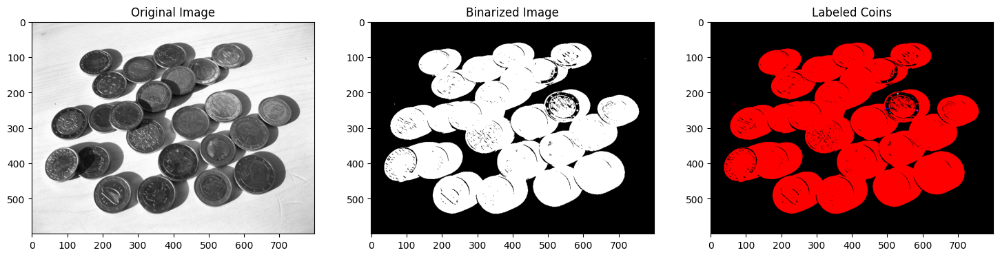

Number of coins: 36


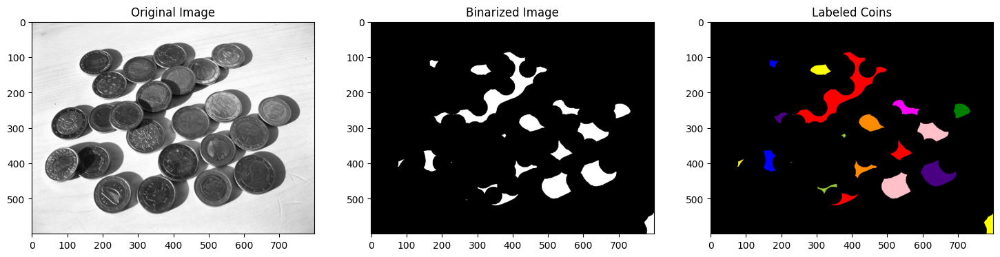

Number of coins: 23


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.morphology import disk, dilation, label
from skimage.filters import threshold_otsu
from skimage.color import label2rgb

# Load image
Img = np.array(Image.open('/content/drive/MyDrive/IVP/coins.png'))

# Counting on original image
plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 1)
plt.imshow(Img, cmap='gray')
plt.title('Original Image')

# Binarize the original image
level = threshold_otsu(Img)
bwImg1 = 1 - (Img > level)

plt.subplot(1, 3, 2)
plt.imshow(bwImg1, cmap='gray')
plt.title('Binarized Image')

# Object counting
L, obj = label(bwImg1, connectivity=2, return_num=True)
rgbLabel1 = label2rgb(L, bg_label=0)

plt.subplot(1, 3, 3)
plt.imshow(rgbLabel1)
plt.title('Labeled Coins')
plt.show()

print('Number of coins:', obj)

# Counting on processed image
plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 1)
plt.imshow(Img, cmap='gray')
plt.title('Original Image')

# Binarize the original image
se = disk(25)
dilatedImg = dilation(Img, footprint=se)
level = threshold_otsu(dilatedImg)
bwImg2 = 1 - (dilatedImg > level)

plt.subplot(1, 3, 2)
plt.imshow(bwImg2, cmap='gray')
plt.title('Binarized Image')

# Object counting
L, obj = label(bwImg2, connectivity=2, return_num=True)
rgbLabel2 = label2rgb(L, bg_label=0)

plt.subplot(1, 3, 3)
plt.imshow(rgbLabel2)
plt.title('Labeled Coins')
plt.show()

print('Number of coins:', obj)


## DAY 9

### Problem 9.1 - Edge Detector (Prewitt)

```
%Problem 9_1 Edge Detector (Prewitt)
clear , clc, close all;

%load image
% Img = im2double(rgb2gray(imread('car.jpg')));
Img = double(imread('bike.png'));

h = fspecial('prewitt');
%apply Prewitt filter in vertical direction
filteredImg1 = imfilter(Img, h', 'replicate');
filteredImg1 = abs(filteredImg1);
%normalize filteredImg1
filteredImg1 = filteredImg1 / max(filteredImg1(:));

%apply Prewitt filter in horizontal direction
filteredImg2 = imfilter(Img, h, 'replicate');
filteredImg2 = abs(filteredImg2);
%normalize filteredImg2
filteredImg2 = filteredImg2 / max(filteredImg2(:));

%show and save images
figure(1), clf;
subplot(1, 3, 1), imshow(uint8(Img)), title('Original Image');
subplot(1, 3, 2), imshow(filteredImg1);
title('Prewitt Vertical');
subplot(1, 3, 3), imshow(filteredImg2);
title('Prewitt Horizontal');
imwrite(filteredImg1, 'Prewitt_car_vertical.jpg');
imwrite(filteredImg2, 'Prewitt_car_horizontal.jpg');

%apply Prewitt in both vertical and horizontal directions
% filteredImg1 = log(abs(filteredImg1) + 1);
% filteredImg1 = filteredImg1 / max(filteredImg1(:));
% filteredImg2 = log(abs(filteredImg2) + 1);
% filteredImg2 = filteredImg2 / max(filteredImg2(:));
% filteredImg1 = imfilter(Img, h', 'replicate');
% filteredImg2 = double(imfilter(Img, h, 'replicate'));
EdgeSum = filteredImg1.^2 + filteredImg2.^2;
logEdgeSum = log(EdgeSum + 1);
logEdgeSum = logEdgeSum / max(logEdgeSum(:));
bwEdge1 = EdgeSum > 6e-5;
bwEdge2 = EdgeSum > 9e-5;
bwEdge3 = EdgeSum > 9.5e-5;

%show and save images
figure(2), clf;
subplot(2, 2, 1), imshow(logEdgeSum), title('Edge Magnitude');
subplot(2, 2, 2), imshow(bwEdge1), title('Mag > 150');
subplot(2, 2, 3), imshow(bwEdge2), title('Mag > 300');
subplot(2, 2, 4), imshow(bwEdge3), title('Mag > 900');
imwrite(logEdgeSum, 'Prewitt_car_2d.png');
imwrite(bwEdge1, 'Prewitt_car_bwEdge1.png');
imwrite(bwEdge2, 'Prewitt_car_bwEdge2.png');
imwrite(bwEdge3, 'Prewitt_car_bwEdge3.png');
```

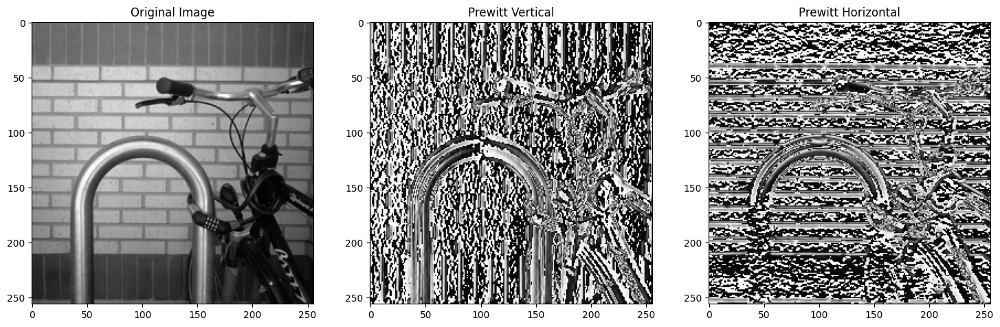

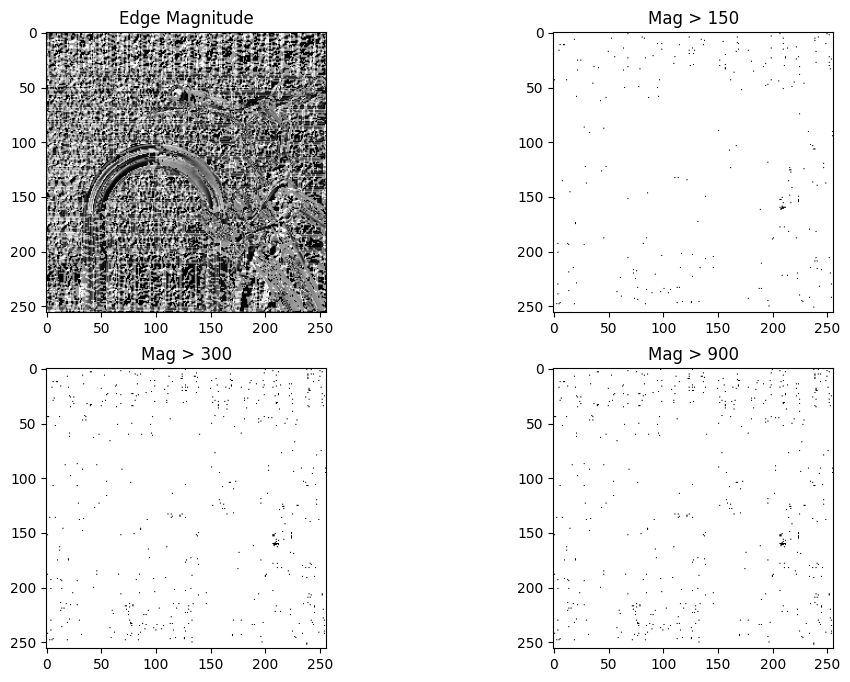

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from scipy.ndimage import convolve
from skimage.filters import prewitt

# Load image
Img = np.array(Image.open('/content/drive/MyDrive/IVP/bike.png'))

# Define Prewitt filters
prewitt_vertical = np.array([[-1, 0, 1],
                             [-1, 0, 1],
                             [-1, 0, 1]])
prewitt_horizontal = np.array([[-1, -1, -1],
                               [ 0,  0,  0],
                               [ 1,  1,  1]])

# Apply Prewitt filter in vertical direction
filteredImg1 = convolve(Img, prewitt_vertical, mode='constant', cval=0)
filteredImg1 = np.abs(filteredImg1)
# Normalize filteredImg1
filteredImg1 = filteredImg1 / np.max(filteredImg1)

# Apply Prewitt filter in horizontal direction
filteredImg2 = convolve(Img, prewitt_horizontal, mode='constant', cval=0)
filteredImg2 = np.abs(filteredImg2)
# Normalize filteredImg2
filteredImg2 = filteredImg2 / np.max(filteredImg2)

# Show and save images
plt.figure(1, figsize=(18, 6))
plt.subplot(1, 3, 1)
plt.imshow(Img.astype(np.uint8), cmap='gray')
plt.title('Original Image')

plt.subplot(1, 3, 2)
plt.imshow(filteredImg1, cmap='gray')
plt.title('Prewitt Vertical')

plt.subplot(1, 3, 3)
plt.imshow(filteredImg2, cmap='gray')
plt.title('Prewitt Horizontal')

plt.show()

# Apply Prewitt in both vertical and horizontal directions
EdgeSum = filteredImg1**2 + filteredImg2**2
logEdgeSum = np.log(EdgeSum + 1)
logEdgeSum = logEdgeSum / np.max(logEdgeSum)

# Thresholding
bwEdge1 = EdgeSum > 6e-5
bwEdge2 = EdgeSum > 9e-5
bwEdge3 = EdgeSum > 9.5e-5

# Show and save images
plt.figure(2, figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.imshow(logEdgeSum, cmap='gray')
plt.title('Edge Magnitude')

plt.subplot(2, 2, 2)
plt.imshow(bwEdge1, cmap='gray')
plt.title('Mag > 150')

plt.subplot(2, 2, 3)
plt.imshow(bwEdge2, cmap='gray')
plt.title('Mag > 300')

plt.subplot(2, 2, 4)
plt.imshow(bwEdge3, cmap='gray')
plt.title('Mag > 900')

plt.show()


### Problem 9.2 - Zero-Crossing by Laplacian

```
%Problem 9_2 Zero-Crossing by Laplacian
clear, clc, close all;

%load image
Img = imread('portrait_male.png');

%find zero-crossings of Laplacian
h = fspecial('laplacian', 0);
bw = edge(Img, 'zerocross', 0, h);

%show and save images
subplot(1, 2, 1), imshow(Img), title('Original Image');
subplot(1, 2, 2), imshow(bw);
title('Zeros Crossings of Laplacian');
```

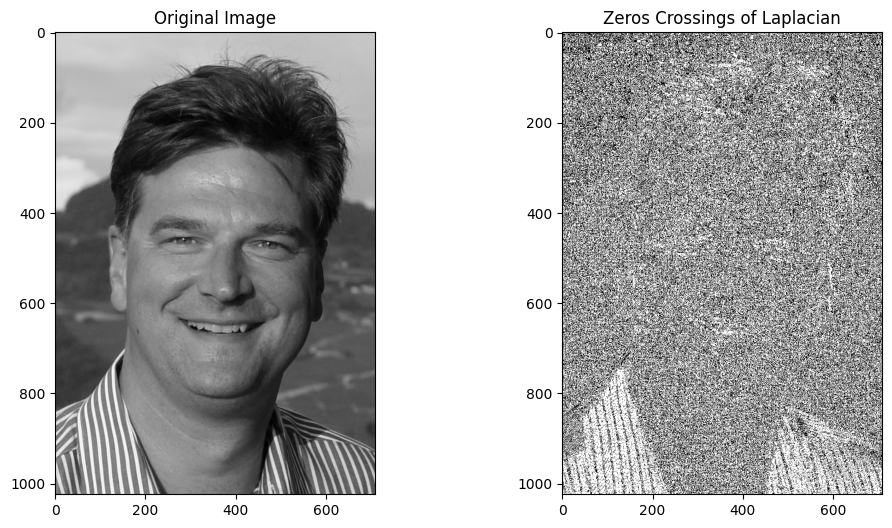

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.filters import laplace
from scipy.ndimage import generic_filter

# Load image
Img = np.array(Image.open('/content/drive/MyDrive/IVP/portrait_male.png'))

# Define the zero-crossing function
def zero_crossing_filter(arr):
    arr = arr - np.mean(arr)
    return (arr[0] < 0 and arr[-1] > 0) or (arr[0] > 0 and arr[-1] < 0)

# Find zero-crossings of Laplacian
laplacian_img = laplace(Img)
bw = generic_filter(laplacian_img, zero_crossing_filter, size=3)

# Show and save images
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(Img, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(bw, cmap='gray')
plt.title('Zeros Crossings of Laplacian')


plt.show()


### Problem 9.3 - Zeros-crossings of Laplacian of Gaussian (LoG)

```
%Problem 9_3 Zeros-crossings of Laplacian of Gaussian (LoG)
clear, clc, close all;

%load image
Img = imread('portrait_male.png');

%loop over different standard deviations of Gaussian
%use no threshold on edge response
thresh = 0;
sigmaArray = [sqrt(2) sqrt(8) sqrt(32) sqrt(128)];

figure(1), clf;
for i = 1 : numel(sigmaArray)
    %compute and show zero crossings
    sigma = sigmaArray(i);
    bw = edge(Img, 'log', thresh, sigma);
    subplot(2, 2, i), imshow(bw);
    title(sprintf('Sigma = %f', sigma));
    imwrite(bw, ['Zero_crossings_log_no_threshold_' num2str(sigma), '.png']);
end

%loop over different standard deviations of Gaussian
%use different thresholds on edge response
thresh = [0.004 0.0008 0.0004 0.0001];
sigmaArray = [sqrt(2) sqrt(8) sqrt(32) sqrt(128)];

figure(2), clf;
for i = 1 : numel(sigmaArray)
    %compute and show zero crossings
    sigma = sigmaArray(i);
    bw = edge(Img, 'log', thresh(i), sigma);
    subplot(2, 2, i), imshow(bw);
    title(sprintf('Sigma = %f', sigma));
    imwrite(bw, ['Zero_crossings_log_threshold_' num2str(sigma), '.png']);
end
```

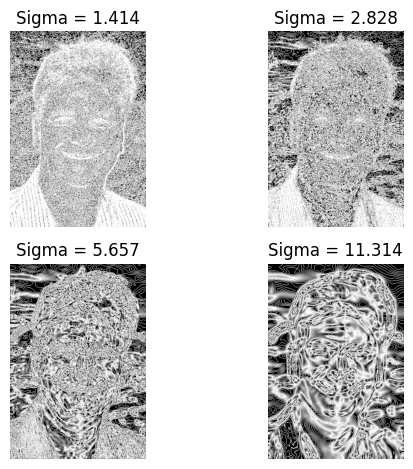

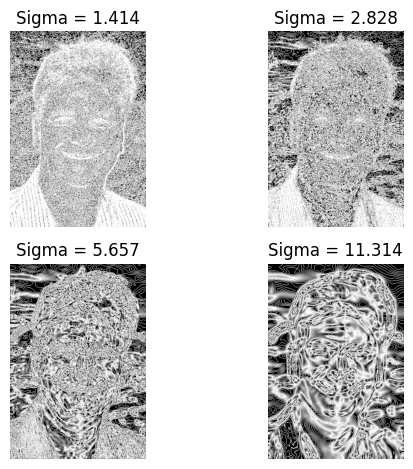

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img = cv2.imread('/content/drive/MyDrive/IVP/portrait_male.png', cv2.IMREAD_GRAYSCALE)

thresh = 0
sigmaArray = [np.sqrt(2), np.sqrt(8), np.sqrt(32), np.sqrt(128)]

for i, sigma in enumerate(sigmaArray):
    blurred = cv2.GaussianBlur(img, (0, 0), sigma)
    laplacian = cv2.Laplacian(blurred, cv2.CV_64F)

    bw = np.zeros_like(laplacian)
    bw[np.where(np.logical_or(laplacian > thresh, laplacian < -thresh))] = 255

    plt.subplot(2, 2, i+1)
    plt.imshow(bw, cmap='gray')
    plt.title(f'Sigma = {sigma:.3f}')
    plt.axis('off')

plt.tight_layout()
plt.show()

thresh = [0.004, 0.0008, 0.0004, 0.0001]
sigmaArray = [np.sqrt(2), np.sqrt(8), np.sqrt(32), np.sqrt(128)]

for i, sigma in enumerate(sigmaArray):
    blurred = cv2.GaussianBlur(img, (0, 0), sigma)
    laplacian = cv2.Laplacian(blurred, cv2.CV_64F)

    bw = np.zeros_like(laplacian)
    bw[np.where(np.logical_or(laplacian > thresh[i], laplacian < -thresh[i]))] = 255

    # plt.imshow(bw, cmap='gray')
    # plt.title(f"Sigma = {sigma}")
    # plt.show()

    plt.subplot(2, 2, i+1)
    plt.imshow(bw, cmap='gray')
    plt.title(f'Sigma = {sigma:.3f}')
    plt.axis('off')

plt.tight_layout()
plt.show()


### Problem 9.4 - Canny Edge Detector

```
%problem 9_4 Canny Edge Detector
clear, clc, close all;

%load image
Img = imread('portrait_male.png');

thresh = 0.005; sigma = sqrt(16);
bw = edge(Img, 'canny', thresh, sigma);

subplot(1, 2, 1), imshow(Img), title('Original Image');
subplot(1, 2, 2), imshow(bw);
title(sprintf('Sigma = %.2f', sigma));
```

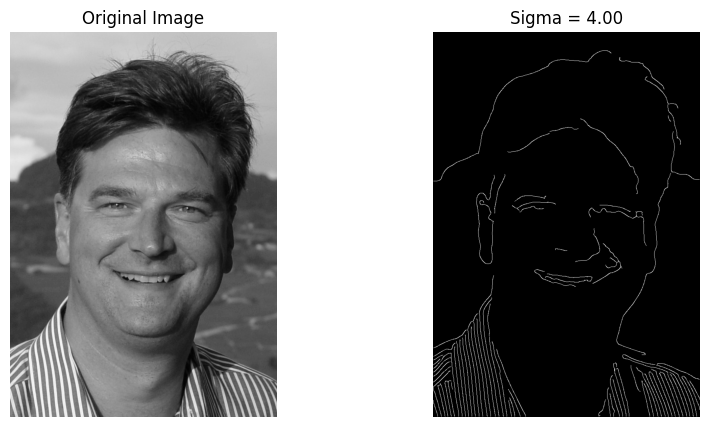

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage import feature

# Load image
Img = np.array(Image.open('/content/drive/MyDrive/IVP/portrait_male.png'))

# Set threshold and sigma for Canny edge detector
thresh = 0.005
sigma = np.sqrt(16)

# Apply Canny edge detector
bw = feature.canny(Img, sigma=sigma, low_threshold=thresh)

# Display the results
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(Img, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(bw, cmap='gray')
plt.title(f'Sigma = {sigma:.2f}')
plt.axis('off')

plt.show()


## DAY 10

### Problem 10.1 - Manual Gray Level Threshold

```
%Problem 10_1 Manual Gray Level Threshold
clear, clc, close all;

%load image
Img = imread('male.png');

%define our own threshold value
level = 108; %choose manually
bwImg = Img < level;
blendedImg = Img .* uint8(bwImg);

%show images
subplot(1, 3, 1), imshow(Img), title('Original Image');
subplot(1, 3, 2), imshow(bwImg), title('Thresholded Image');
subplot(1, 3, 3), imshow(blendedImg), title('Binary Map Original');

```

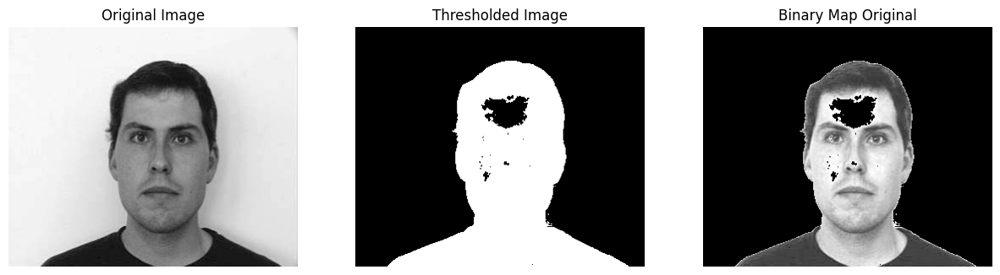

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Load image
Img = np.array(Image.open('/content/drive/MyDrive/IVP/male.png'))

# Define our own threshold value
level = 110  # Choose manually

# Apply thresholding to create binary image
bwImg = Img < level
blendedImg = Img * bwImg.astype(np.uint8)

# Display the images
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(Img, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(bwImg, cmap='gray')
plt.title('Thresholded Image')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(blendedImg, cmap='gray')
plt.title('Binary Map Original')
plt.axis('off')

plt.show()


### Problem 10.2 - Global Gray Level Threshold

```
%Problem 10_2 Global Gray Leevl Threshold
clear, clc, close all;

%load image
%Img = imread('male.png');
Img = imread('paper.png');

%global thresholding by Otsu method
level = graythresh(Img); %choose by Otsu method
bwImg = imbinarize(Img, level);
blendedImg = (1 - bwImg) .* im2double(Img);

%show images
subplot(1, 3, 1), imshow(Img), title('Original Image');
subplot(1, 3, 2), imshow(bwImg), title('Globally Threshold');
subplot(1, 3, 3), imshow(blendedImg),
title('Overlay Image'); axes('Parent', figure, 'FontSize', 12);

%show histogram of image and threshold value
[counts, x] = imhist(Img);
bar(x, counts), hold on;
OtsuThresh = round(level*255)
h = plot(OtsuThresh * ones(1,100), linspace(0,max(counts)),'g-');
axis([0 255 0 max(counts)]);
set(gca, 'FontSize', 12); set(gcf, 'Color', 'white');

```

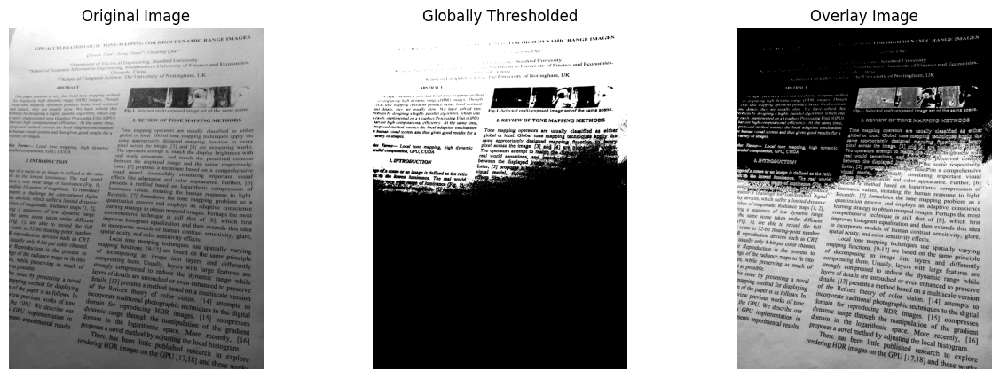

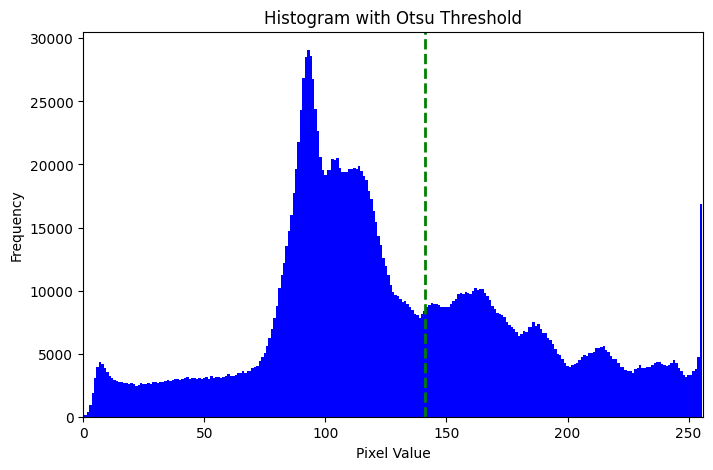

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Load image
Img = np.array(Image.open('/content/drive/MyDrive/IVP/paper.png'))

# Global thresholding by Otsu method
level = threshold_otsu(Img)  # Calculate threshold using Otsu's method
bwImg = Img > level
blendedImg = (1 - bwImg) * Img

# Show images
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(Img, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(bwImg, cmap='gray')
plt.title('Globally Thresholded')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(blendedImg, cmap='gray')
plt.title('Overlay Image')
plt.axis('off')

# Show histogram of the image and threshold value
hist, bins = np.histogram(Img, bins=256, range=[0, 256])
plt.figure(figsize=(8, 5))
plt.bar(bins[:-1], hist, width=1, align='center', color='b')
plt.axvline(level, color='g', linestyle='--', linewidth=2)
plt.xlim([0, 256])
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.title('Histogram with Otsu Threshold')
plt.show()


### Problem 10.3 - Local Adaptive Threshold

```
%Problem 10_3 Local Adaptive Threshold
clear, clc, close all;

%load image
Img = im2double(imread('paper.png'));

level = graythresh(Img);
globalbwImg = imbinarize(Img, level);
%local threshold
[row col] = size(Img);
stepSize = 16; tileSize = 32;
varThresh = 0.0005;
localbwImg = zeros(row, col); %initialize a zero matrix
uniformMask = zeros(row, col);
threshImg = zeros(row/stepSize, col/stepSize);
for i = 1 : row/stepSize
    %get indices for row
    rowStep = (i-1) * stepSize + 1:i*stepSize;
    rowTile = (i-1) * stepSize + 1:(i+1)*stepSize;
    if i == row/stepSize
        rowTile = (i-2) * stepSize + 1:i*stepSize;
    end %end of if

    %determine local Otsu's threshold  for every single row
    rowThresh = graythresh(Img(rowTile,:));

    for j = 1 : col/stepSize
        %get indices for col
        colStep = (j-1) * stepSize + 1:j*stepSize;
        colTile = (j-1) * stepSize + 1:(j+1)*stepSize;
        if j == col/stepSize
            colTile = (j-2) * stepSize + 1:j*stepSize;
        end %end of if

        %determine local variance
        step = Img(rowStep, colStep);
        varStep = var(step(:));
        %determine local Otsu's threshold  for every single col
        tile = Img(rowTile, colTile);
        colThresh = graythresh(tile);

        %convert each tile to bw image based on local Otsu
        if (varStep > varThresh)
            localbwImg(rowStep, colStep) = imbinarize(step, colThresh);
            uniformMask(rowStep, colStep) = ones(stepSize, stepSize);
            threshImg(i,j) = colThresh;
        else %threshold based on local mean
            localMean = mean(tile(:));
            threshImg(i,j) = 0;
            if (localMean > min(rowThresh, level))
                localbwImg(rowStep, colStep) = ones(stepSize, stepSize);
            else
                localbwImg(rowStep, colStep) = zeros(stepSize, stepSize);
            end %end of if
            uniformMask(rowStep, colStep) = zeros(stepSize, stepSize);
        end %end of if
    end %end of j
end %end of i

%show images
figure, clf;
subplot(1, 3, 1), imshow(Img), title('Original Image');
subplot(1, 3, 2), imshow(globalbwImg), title('Global Threshold');
subplot(1, 3, 3), imshow(localbwImg), title('Local Threshold');

%with uniformMask
figure(2), clf;
subplot(1, 2, 1), imshow(uniformMask .* Img),
title('Original Image with Uniform Mask');
subplot(1, 2, 2), imshow(threshImg),
title('Local Threshold Image');
```

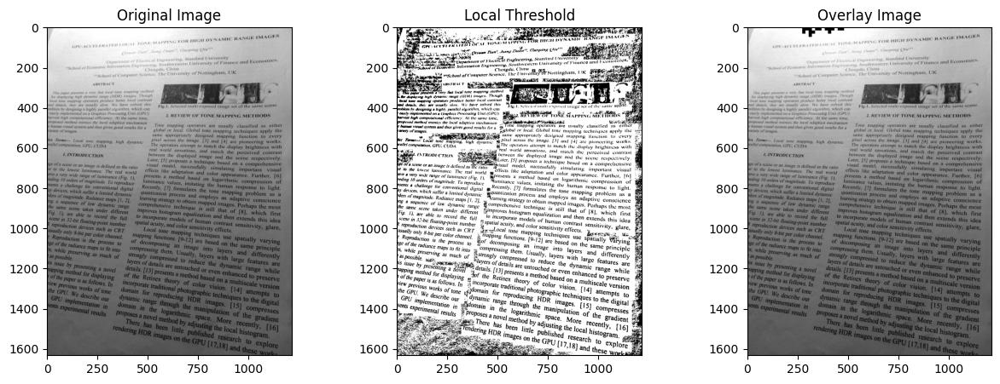

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import threshold_otsu

# Load image
Img = np.array(Image.open('/content/drive/MyDrive/IVP/paper.png'))

# Define parameters
level = threshold_otsu(Img)
row, col = Img.shape
stepSize = 16
tileSize = 32
varThresh = 0.0005

# Initialize masks and threshold image
localbwImg = np.zeros((row, col), dtype=np.uint8)
uniformMask = np.zeros((row, col), dtype=np.uint8)
threshImg = np.zeros((row // stepSize, col // stepSize), dtype=np.float64)

# Loop over tiles
for i in range(row // stepSize):
    rowStep = slice(i * stepSize, (i + 1) * stepSize)
    rowTile = slice((i - 1) * stepSize, (i + 1) * stepSize)

    if i == 0:
        rowTile = slice(i * stepSize, (i + 1) * stepSize)
    elif i == row // stepSize - 1:
        rowTile = slice((i - 1) * stepSize, i * stepSize)

    rowThresh = threshold_otsu(Img[rowTile, :])

    for j in range(col // stepSize):
        colStep = slice(j * stepSize, (j + 1) * stepSize)
        colTile = slice((j - 1) * stepSize, (j + 1) * stepSize)

        if j == 0:
            colTile = slice(j * stepSize, (j + 1) * stepSize)
        elif j == col // stepSize - 1:
            colTile = slice((j - 1) * stepSize, j * stepSize)

        step = Img[rowStep, colStep]
        varStep = np.var(step)
        colThresh = threshold_otsu(Img[rowTile, colTile])

        if varStep > varThresh:
            localbwImg[rowStep, colStep] = (step >= colThresh)
            uniformMask[rowStep, colStep] = 1
            threshImg[i, j] = colThresh
        else:
            localMean = np.mean(Img[rowTile, colTile])
            threshImg[i, j] = 0
            if localMean > min(rowThresh, level):
                localbwImg[rowStep, colStep] = 1
            else:
                localbwImg[rowStep, colStep] = 0
            uniformMask[rowStep, colStep] = 0

# Show images
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1), plt.imshow(Img, cmap='gray'), plt.title('Original Image')
plt.subplot(1, 3, 2), plt.imshow(localbwImg, cmap='gray'), plt.title('Local Threshold')
plt.subplot(1, 3, 3), plt.imshow(uniformMask * Img, cmap='gray'), plt.title('Overlay Image')
plt.show()


## Day  11

### Problem 11.1 -  Pseudocolor Image Processing

```
%Problem 11_1 Pseudocolor Image Processing
clear, clc, close all;

%create and display a gradient image
I = repmat(uint8([0:255]), 256, 1);
figure, subplot(1,2,1), subimage(I), title('Original Image');

%slice the image and display the results
I2 = grayslice(I,16);
subplot(1,2,2), subimage(I2, colormap(winter(16)));
title("Pseudo-colored with 'winter' colormap");

%slice the image into unequal partitions and display the results
levels = [0.25*255 0.75*255 0.9*255];
I3 = grayslice(I, levels);
figure, imshow(I3, spring(4));
```

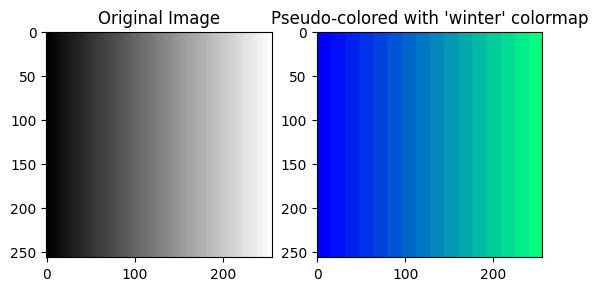

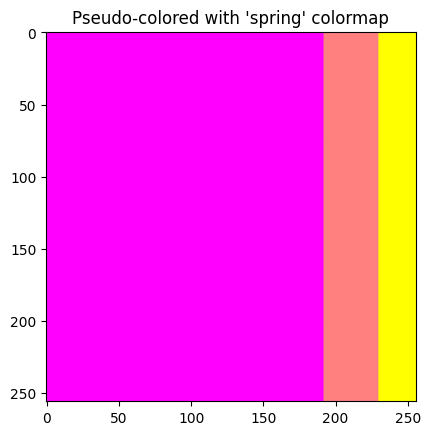

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# create and display a gradient image
I = np.tile(np.arange(256, dtype=np.uint8), (256, 1))
plt.subplot(1, 2, 1)
plt.imshow(I, cmap='gray')
plt.title('Original Image')

# slice the image and display the results
I2 = np.digitize(I, np.linspace(0, 255, 17)) - 1
plt.subplot(1, 2, 2)
plt.imshow(I2, cmap='winter', vmin=0, vmax=15)
plt.title("Pseudo-colored with 'winter' colormap")

# slice the image into unequal partitions and display the results
levels = [0.25 * 255, 0.75 * 255, 0.9 * 255]
I3 = np.digitize(I, levels) - 1
plt.figure()
plt.imshow(I3, cmap='spring', vmin=0, vmax=2)
plt.title("Pseudo-colored with 'spring' colormap")
plt.show()


### Problem 11.2 - Pseudo-colored to Grayscale Image Conversion

```
%Problem 11_2 Pseudo-colored to grayscale image
clear, clc, close all;

%load image
Img = imread('brain.jpg');
subplot(1,2,1), subimage(Img), title('Original Image');

%pseudo-color image
I2 = grayslice(Img, 16);
subplot(1,2,2), subimage(I2, colormap(jet(16)));
title("Pseudo-colored with 'jet' colormap");
```

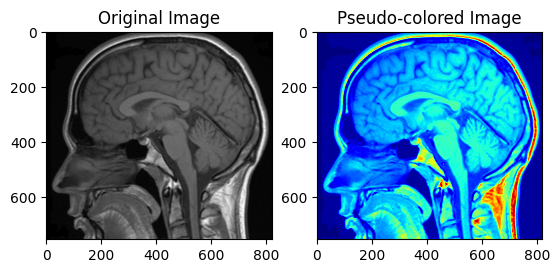

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Load a grayscale brain.jpg image
I = np.array(Image.open('/content/drive/MyDrive/IVP/brain.jpg').convert('L'))

# Display the image
plt.subplot(1,2,1), plt.imshow(I, cmap='gray'), plt.title('Original Image')

plt.subplot(1,2,2), plt.imshow(I, cmap='jet'), plt.title('Pseudo-colored Image')
plt.show()

### Problem 11.3 - Full color image processing

```
%Problem 11_3 full-color image processing
clear, clc, close all;

%load image
Img = imread('flowerfield.jpg');

subplot(2,4,1), imshow(Img), title("Original Image");
subplot(2,4,2), imshow(Img(:,:,1)), title("R Component");
subplot(2,4,3), imshow(Img(:,:,2)), title("G Component");
subplot(2,4,4), imshow(Img(:,:,3)), title("B Component");

%convert from RGB to HSV color model and display its components
Imghsv = rgb2hsv(Img);
subplot(2,4,6), imshow(Imghsv(:,:,1)), title("Hue");
subplot(2,4,7), imshow(Imghsv(:,:,2)), title("Saturation");
subplot(2,4,8), imshow(Imghsv(:,:,3)), title("Value");
```

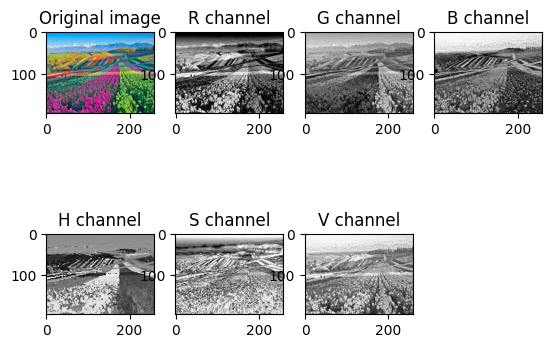

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from skimage.color import rgb2hsv

# Read image named 'flowerfield.jpg'
I = np.array(Image.open('/content/drive/MyDrive/IVP/flowerfield.jpg'))

plt.subplot(2,4,1), plt.imshow(I), plt.title('Original image')
plt.subplot(2,4,2), plt.imshow(I[:,:,0], cmap='gray'), plt.title('R channel')
plt.subplot(2,4,3), plt.imshow(I[:,:,1], cmap='gray'), plt.title('G channel')
plt.subplot(2,4,4), plt.imshow(I[:,:,2], cmap='gray'), plt.title('B channel')

# Convert image to HSV color space and show the channels
I_hsv = rgb2hsv(I)
plt.subplot(2,4,5), plt.imshow(I_hsv[:,:,0], cmap='gray'), plt.title('H channel')
plt.subplot(2,4,6), plt.imshow(I_hsv[:,:,1], cmap='gray'), plt.title('S channel')
plt.subplot(2,4,7), plt.imshow(I_hsv[:,:,2], cmap='gray'), plt.title('V channel')

plt.show()

### Problem 11.4 - Compare grayscale image and value image in hsv

```
%Problem 11_4 compare grayscale image and value image in hsv
clear, clc, close all;

%load image
Img = imread('flowerfield.jpg');
Imggray = rgb2gray(Img); %grayscale image
Imghsv = rgb2hsv(Img); %hsv image

subplot(1,2,1), imshow(Imggray), title("Grayscale Image");
subplot(1,2,2), imshow(Imghsv(:,:,3)), title("Value Image");
```

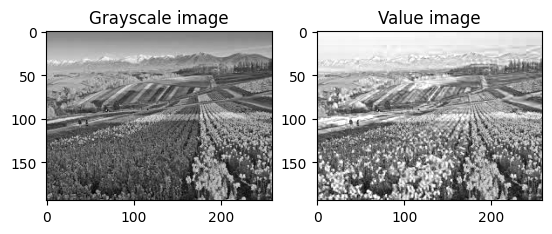

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from skimage.color import rgb2gray, rgb2hsv

# Read image named 'flowerfield.jpg'
I = np.array(Image.open('/content/drive/MyDrive/IVP/flowerfield.jpg'))

# Convert image to grayscale
I_gray = rgb2gray(I)

# Convert image to HSV color space
I_hsv = rgb2hsv(I)

# Extract value channel
I_value = I_hsv[:,:,2]

# Display images
plt.subplot(1,2,1), plt.imshow(I_gray, cmap='gray'), plt.title('Grayscale image')
plt.subplot(1,2,2), plt.imshow(I_value, cmap='gray'), plt.title('Value image')
plt.show()

### Problem 11.5 - Smooth each component of an image

```
%Problem 11_5 smooth each component of color image by a filter
clear, clc, close all;

%load image
Img = imread('flowerfield.jpg');

%define a filter
fn = fspecial("average");
Img2r = imfilter(Img(:,:,1), fn);
Img2g = imfilter(Img(:,:,2), fn);
Img2b = imfilter(Img(:,:,3), fn);

Img2(:,:,1) = Img2r;
Img2(:,:,2) = Img2g;
Img2(:,:,3) = Img2b;

%plot and display
subplot(1,2,1), imshow(Img), title("Original Image");
subplot(1,2,2), imshow(Img2), title("Averaged Image");
```

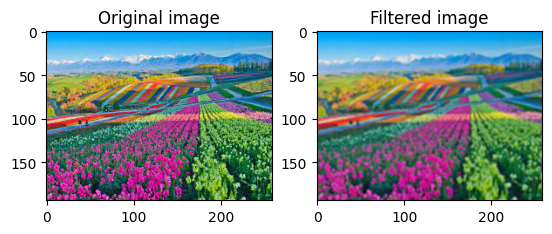

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from scipy.signal import convolve2d

# Read image named 'flowerfield.jpg'
I = np.array(Image.open('/content/drive/MyDrive/IVP/flowerfield.jpg'))

# Define a filter
fn = np.ones((3,3))/9

# Smooth each component of the image
I2r = convolve2d(I[:,:,0], fn, mode='same', boundary='symm')
I2g = convolve2d(I[:,:,1], fn, mode='same', boundary='symm')
I2b = convolve2d(I[:,:,2], fn, mode='same', boundary='symm')

I2 = np.zeros_like(I)
I2[:,:,0] = I2r
I2[:,:,1] = I2g
I2[:,:,2] = I2b

# Display the original and filtered images
plt.subplot(1,2,1), plt.imshow(I), plt.title('Original image')
plt.subplot(1,2,2), plt.imshow(I2), plt.title('Filtered image')
plt.show()

### Problem 11.6 - Determinant of Hessian (DoH) Detector

```
%Problem 11_6 Determinant of Hessian (DoH) Detector
clear, clc, close all;

%load image
Img = im2double(imread('circuit.jpg'));
Imggray = rgb2gray(Img);

figure(1), clf;
imshow(Img), title('Original Image');

%create filters
sigma = 2;
g = fspecial('gaussian', [10*sigma+1, 10*sigma+1], sigma);
s = fspecial('sobel');

filterXG = imfilter(imfilter(g,s.','replicate'),s.','replicate');
filterYG = imfilter(imfilter(g,s,'replicate'),s,'replicate');
filterXYG = imfilter(imfilter(g,s.','replicate'),s,'replicate');

figure(2), clf;
subplot(1,3,1), imshow(filterXG, [-0.2 0.2]),
title('Filter along x');
subplot(1,3,2), imshow(filterYG, [-0.2 0.2]),
title('Filter along y');
subplot(1,3,3), imshow(filterXYG, [-0.2 0.2]),
title('Filter along x-y');

%calculate Determinant of Hessian (DoH)
ImgDxx = imfilter(Imggray, filterXG, 'replicate');
ImgDyy = imfilter(Imggray, filterYG, 'replicate');
ImgDxy = imfilter(Imggray, filterXYG, 'replicate');
ImgFilt = ImgDxx.*ImgDyy - ImgDxy.^2; %determinant

figure(3), clf;
imshow(ImgFilt, [-1 1]), title('Determinant of Hessian');

%find extrema (local maxima)
ImgFilt(find(ImgFilt < 0.5*max(ImgFilt(:)))) = 0;
ImgExt = imregionalmax(ImgFilt);
figure(4), clf;
imshow(ImgFilt, [-1 1]), title('Thresholded Response');
figure(5), clf;
imshow(imdilate(ImgExt, ones(3,3))), title("Local Maxima 3x3");

%show N strongest keypoints
numCorners = sum(ImgExt(:))
figure(6), clf;
imshow(Img), hold on;
[row, col] = find(ImgExt == 1);
responses = zeros(1, numel(row));
for n = 1 : numel(row)
    responses(n) = ImgFilt(row(n), col(n));
end
[responses, sortIdx] = sort(responses, 'descend');
for n = 1 : 20 %N = 20
    h = plot(col(sortIdx(n)), row(sortIdx(n)), 'y+');
    set(h, 'MarkerSize', 15, 'MarkerFaceColor', 'y');
end
```

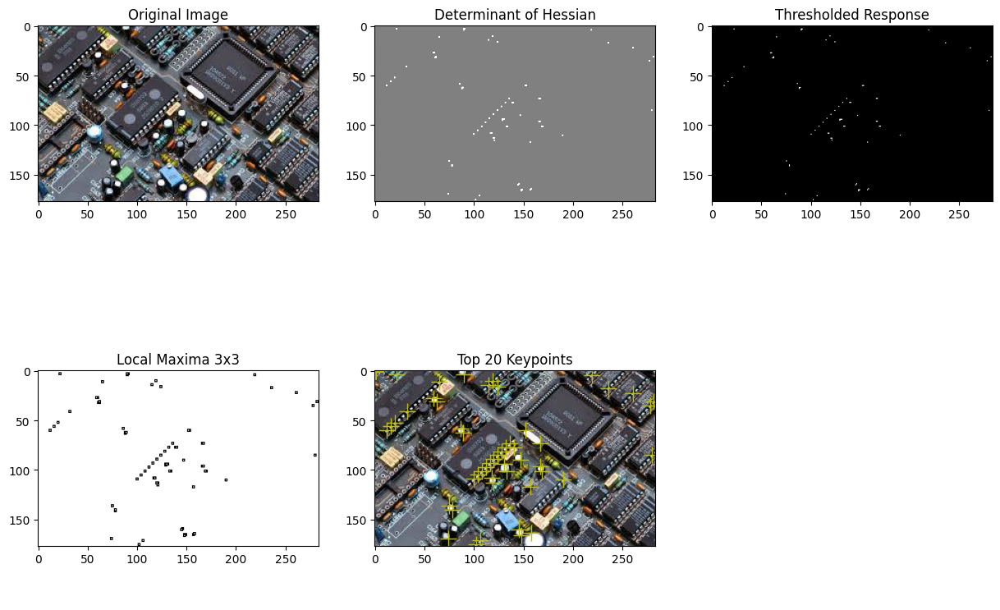

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color
from scipy.ndimage import convolve
from scipy.ndimage import maximum_filter

# Load image
Img = io.imread('/content/drive/MyDrive/IVP/circuit.jpg')
Imggray = color.rgb2gray(Img)

# Create filters
sigma = 2
filter_size = int(6 * sigma + 1)
x, y = np.mgrid[-filter_size // 2:filter_size // 2 + 1, -filter_size // 2:filter_size // 2 + 1]
g = np.exp(-(x**2 + y**2) / (2.0 * sigma**2))  # Gaussian filter

s = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]])
filterXG = convolve(s.T, g, mode='reflect')
filterYG = convolve(s, g, mode='reflect')
filterXYG = convolve(s.T, g, mode='reflect')

# Calculate Determinant of Hessian (DoH)
ImgDxx = convolve(Imggray, filterXG, mode='reflect')
ImgDyy = convolve(Imggray, filterYG, mode='reflect')
ImgDxy = convolve(Imggray, filterXYG, mode='reflect')
ImgFilt = ImgDxx * ImgDyy - ImgDxy**2  # determinant

# Find extrema (local maxima)
threshold = 0.5 * np.max(ImgFilt)
ImgFilt[ImgFilt < threshold] = 0
ImgExt = maximum_filter(ImgFilt, size=3) == ImgFilt

# Show results
numCorners = np.sum(ImgExt)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes[0, 0].imshow(Img)
axes[0, 0].set_title('Original Image')

axes[0, 1].imshow(ImgFilt, cmap='gray', vmin=-1, vmax=1)
axes[0, 1].set_title('Determinant of Hessian')

axes[0, 2].imshow(ImgFilt > threshold, cmap='gray')
axes[0, 2].set_title('Thresholded Response')

axes[1, 0].imshow(ImgExt, cmap='gray')
axes[1, 0].set_title('Local Maxima 3x3')

axes[1, 1].imshow(Img)
for i in range(numCorners):
    row, col = np.unravel_index(np.argmax(ImgFilt), ImgFilt.shape)
    ImgFilt[row - 3: row + 4, col - 3: col + 4] = 0
    axes[1, 1].plot(col, row, 'y+', markersize=15, markerfacecolor='y')

axes[1, 1].set_title("Top 20 Keypoints")

axes[1, 2].axis('off')

plt.show()


### Problem 11.7 - Harris Keypoint Detector

```
%L12_1 Harris Keypoint Detector
clear, clc, close all;

images = {'Harris_a.jpg', 'Harris_b.jpg'};
for nImage = 1 : length(images)
    %load image
    Img = imread(images{nImage});
    Img = im2double(Img);
    ImgGray = rgb2gray(Img);
    figure(1), clf;
    imshow(Img), title('Original Image');

    %calculate Harris cornerness
    C = cornermetric(ImgGray, 'Harris', 'SensitivityFactor', 0.04);
    figure(2), clf;
    imshow(C, [-0.002 0.004]); %colorbar
    title('Harris Cornerness');

    %find extrema
    C(find(C < 0.01*max(C(:)))) = 0;
    ImgExt = imregionalmax(C);
    figure(3), clf;
    imshow(C, [-0.002 0.004]);
    title('Local Maxima');
    figure(4), clf;
    imshow(imdilate(ImgExt, ones(3,3)));
    title('Local Maxima (Dilated)');

    %show maxima keypoints on original image
    numCorners = sum(ImgExt(:));
    figure(5), clf;
    imshow(Img), hold on; title('Harris Keypoints');
    [row, col] = find(ImgExt == 1);
    features = zeros(1, numel(row));
    for n = 1 : numel(row)
        features(n) = C(row(n), col(n));
    end %end of for n
    [features, sortIdx] = sort(features, 'descend');
    for n = 1 : 500
        h = plot(col(sortIdx(n)), row(sortIdx(n)), 'y+');
        set(h, 'MarkerSize', 3, 'MarkerFaceColor', 'y');
    end %end of for n
    pause;
end %end of for nImage
```

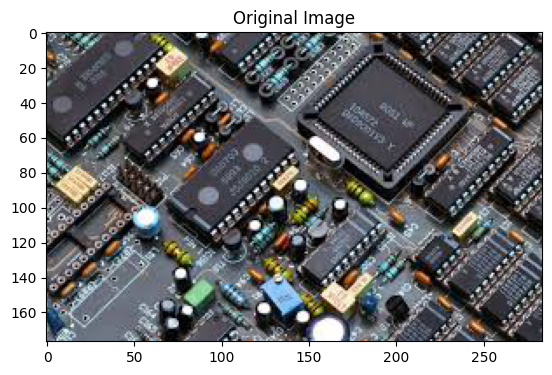

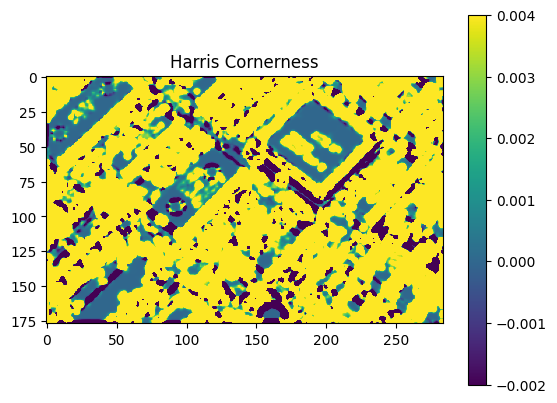

<ipython-input-45-d5b2ccc1a0f3>:29: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  ImgExt = peak_local_max(C, min_distance=5, threshold_abs=threshold, indices=False)


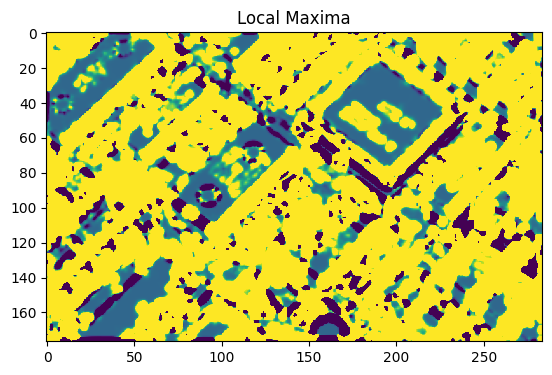

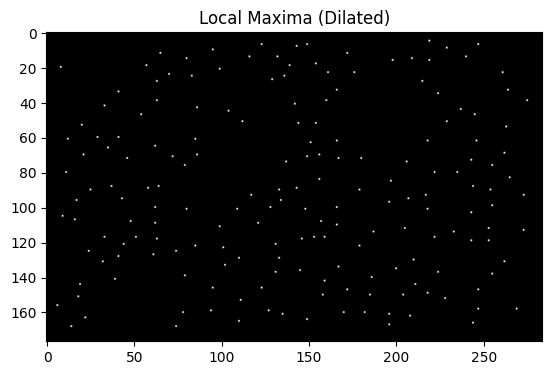

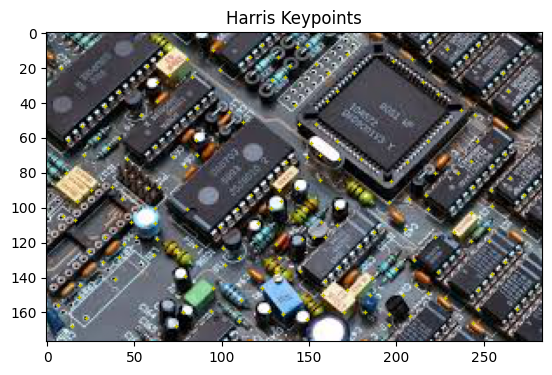

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, feature
from skimage.feature import peak_local_max

# images = ['/content/drive/MyDrive/IVP/Harris_a.jpg', '/content/drive/MyDrive/IVP/Harris_b.jpg']
images = ['/content/drive/MyDrive/IVP/circuit.jpg']

for nImage in range(len(images)):
    # Load image
    Img = io.imread(images[nImage])
    Img = Img / 255.0  # Convert to float
    ImgGray = color.rgb2gray(Img)
    plt.figure(1)
    plt.imshow(Img)
    plt.title('Original Image')
    plt.show()

    # Calculate Harris cornerness
    C = feature.corner_harris(ImgGray)
    plt.figure(2)
    plt.imshow(C, vmin=-0.002, vmax=0.004)
    plt.colorbar()
    plt.title('Harris Cornerness')
    plt.show()

    # Find extrema (local maxima)
    threshold = 0.01 * np.max(C)
    ImgExt = peak_local_max(C, min_distance=5, threshold_abs=threshold, indices=False)
    plt.figure(3)
    plt.imshow(C, vmin=-0.002, vmax=0.004)
    plt.title('Local Maxima')
    plt.show()

    plt.figure(4)
    plt.imshow(ImgExt, cmap='gray')
    plt.title('Local Maxima (Dilated)')
    plt.show()

    # Show maxima keypoints on original image
    keypoints = np.column_stack(np.where(ImgExt > 0))
    numCorners = keypoints.shape[0]
    plt.figure(5)
    plt.imshow(Img)
    plt.title('Harris Keypoints')
    for n in range(numCorners):
        row, col = keypoints[n]
        plt.plot(col, row, 'y+', markersize=3, markerfacecolor='y')
    plt.show()
